In [1]:
import glob
import matplotlib.pyplot as plt
import sys
import xarray as xr
import numpy as np
import pandas as pd
import re
from matplotlib.lines import Line2D
import os
from matplotlib import cm

sys.path.append('/home/chinahg/GCresearch/contrailuncertainty/start_here/')
import pipeline_fxn_lib as lib
sys.path.append('/home/chinahg/GCresearch/contrailuncertainty/LRT/')
import LRT_fxnlib as LRTlib

plt.rcParams["font.family"] = "FreeSerif"
plt.rcParams["mathtext.fontset"] = "cm"

# Figures to include in the final paper

# Meteorology

In [2]:
APCEMM_110T218K_met = xr.open_dataset('/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/APCEMM/base_inputs/110T218L25/110T218L25.nc')

In [3]:
APCEMM_110T218K_met

<xarray.Dataset>
Dimensions:                (altitude: 125, time: 24)
Coordinates:
  * altitude               (altitude) float64 0.0 0.1 0.2 0.3 ... 12.2 12.3 12.4
  * time                   (time) datetime64[ns] 2023-01-01 ... 2023-01-01T23...
    reference_time         datetime64[ns] ...
Data variables:
    shear                  (altitude, time) float64 ...
    stretch                (time) float64 ...
    pressure               (altitude) float64 ...
    temperature            (altitude, time) float64 ...
    w                      (altitude, time) float64 ...
    relative_humidity_ice  (altitude, time) float64 ...
Attributes:
    description:  APCEMM input dataset
    data_source:  artificial

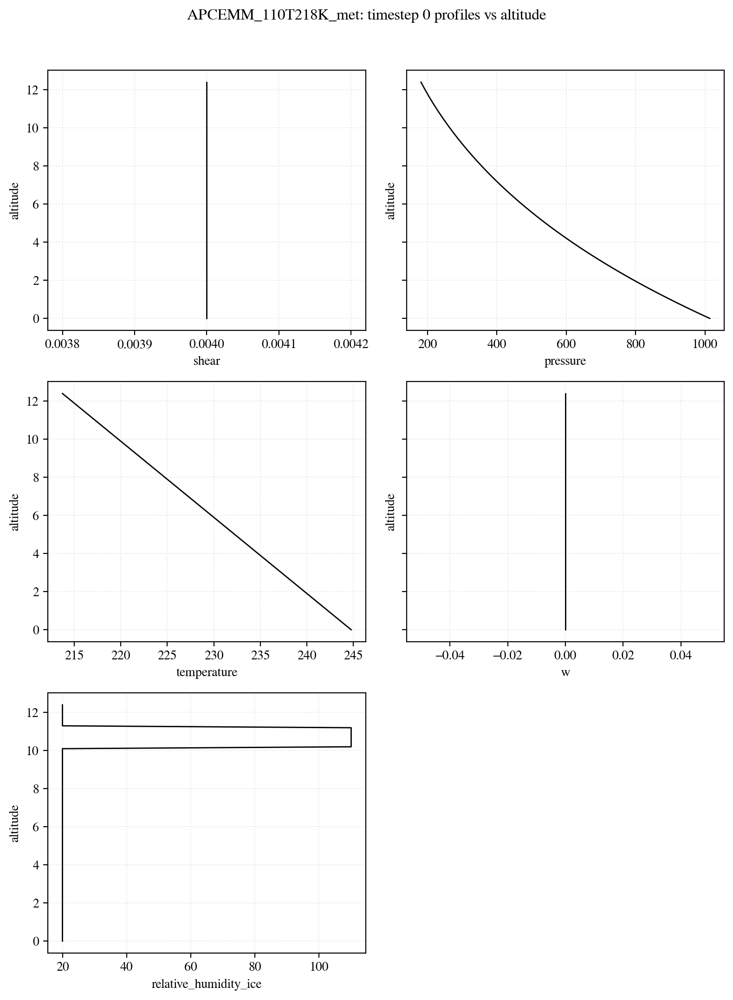

In [4]:
# Plot all APCEMM_110T218K_met variables at timestep 0 versus altitude

ds = APCEMM_110T218K_met

# Find altitude coordinate/dimension
alt_candidates = [c for c in ds.coords if 'alt' in c.lower()] + [d for d in ds.dims if 'alt' in d.lower()]
if not alt_candidates:
    raise ValueError("Could not find an altitude coordinate/dimension in APCEMM_110T218K_met.")
alt_name = alt_candidates[0]
alt = ds[alt_name].values

# Optional: identify time-like dimensions
time_like = {'time', 't', 'itime', 'step'}

plot_vars = []
profiles = {}

for v in ds.data_vars:
    da = ds[v]
    if alt_name not in da.dims:
        continue

    # Slice first index for all non-altitude dims (including time if present)
    isel_dict = {}
    for d in da.dims:
        if d == alt_name:
            continue
        if d.lower() in time_like or 'time' in d.lower():
            isel_dict[d] = 0
        else:
            isel_dict[d] = 0

    da_1d = da.isel(isel_dict)

    # Keep only 1D profiles aligned with altitude
    if da_1d.ndim == 1 and da_1d.dims[0] == alt_name:
        profiles[v] = da_1d.values
        plot_vars.append(v)

if not plot_vars:
    raise ValueError("No altitude-dependent data variables found to plot.")

n = len(plot_vars)
ncols = 2
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 3.5 * nrows), dpi=200, sharey=True)
axes = np.atleast_1d(axes).ravel()

for i, v in enumerate(plot_vars):
    ax = axes[i]
    ax.plot(profiles[v], alt, color='black', linewidth=1)
    ax.set_xlabel(v)
    ax.set_ylabel(alt_name)
    ax.grid(alpha=0.3, linestyle=':')

# Hide unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

fig.suptitle('APCEMM_110T218K_met: timestep 0 profiles vs altitude', y=1.02)
plt.tight_layout()
plt.show()

# Contrail representation in libRadtran

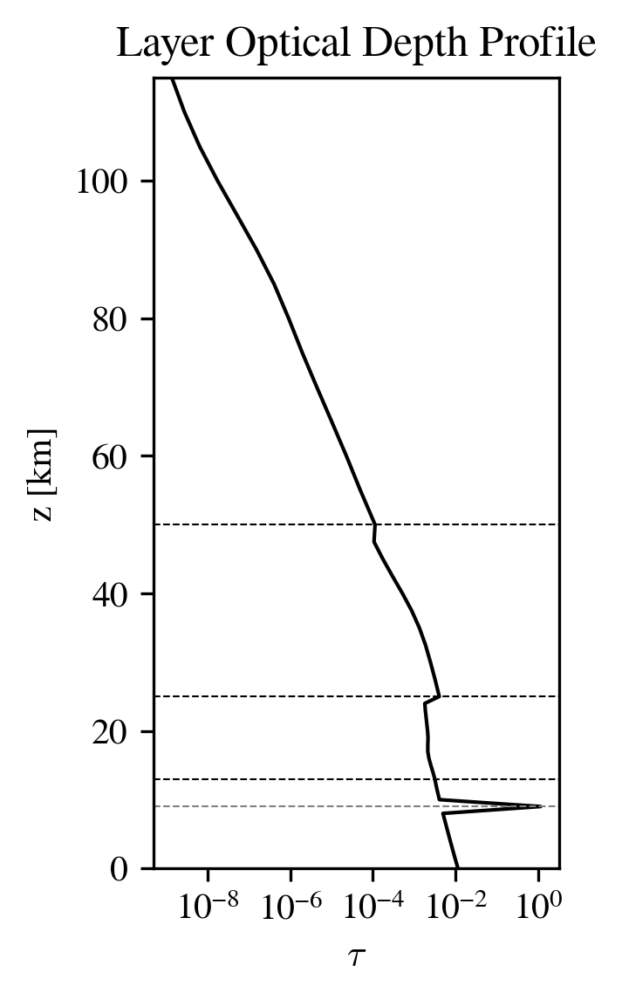

In [5]:
from matplotlib.ticker import LogLocator, LogFormatterSciNotation

# load CSV and plot Net tau vs z [km]
path = '/home/chinahg/GCresearch/contrailuncertainty/LRT/vertical_tau_example_profile.csv'
df = pd.read_csv(path)

tau_col = df.columns[4]
z_col = df.columns[0]

z = df[z_col].astype(float).values
tau = df[tau_col].astype(float).values

plt.figure(figsize=(2,4), dpi=300)
plt.plot(tau, z, color='black', linewidth=1)
plt.xlabel(r'$\tau$')
plt.ylabel('z [km]')
plt.xscale('log')

ax = plt.gca()
ax.xaxis.set_major_locator(LogLocator(base=10.0, numticks=6))
ax.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(1,8), numticks=6))
ax.xaxis.set_major_formatter(LogFormatterSciNotation())
ax.set_ylim(0, 115)
ax.axhline(y=9, color='gray', linestyle='--', linewidth=0.5)
ax.axhline(y=13, color='black', linestyle='--', linewidth=0.5)
ax.axhline(y=25, color='black', linestyle='--', linewidth=0.5)
ax.axhline(y=50, color='black', linestyle='--', linewidth=0.5)

plt.title('Layer Optical Depth Profile')
plt.show()

# Contrail initialization

In [6]:
# Import APCEMM data
temp_groups = ['205', '218', '225']
color_map = {
    '205': 'gray',
    '218': 'red',
    '225': 'green'
}
test_ids = ['110T205L25', '110T218L25', '110T225L25', '130T205L25', '130T218L25', '130T225L25']
apcemm_bypass_data = {}

for test_id in test_ids:
    apcemm_data = lib.read_apcemm_data(
        f'/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/APCEMM/epm_bypass/{test_id}/outputs',
    )
    apcemm_bypass_data[test_id] = apcemm_data.ds_t

# Import each CoCiP bypass dataset into a dictionary, similar to apcemm_bypass_data
cocip_bypass_files = {
    '110T205L25': "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/CoCiP/110T205L25/110T205L25-bypass.nc",
    '110T218L25': "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/CoCiP/110T218L25/110T218L25-bypass.nc",
    '110T225L25': "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/CoCiP/110T225L25/110T225L25-bypass.nc",
    '130T205L25': "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/CoCiP/130T205L25/130T205L25-bypass.nc",
    '130T218L25': "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/CoCiP/130T218L25/130T218L25-bypass.nc",
    '130T225L25': "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/CoCiP/130T225L25/130T225L25-bypass.nc",
}

# Open each CoCiP bypass dataset and store in a dictionary for easy access
cocip_bypass_data = {}
for test_id, filepath in cocip_bypass_files.items():
    cocip_bypass_data[test_id] = xr.open_dataset(filepath)

# Import LES data
LES_files = {
    '110T205L25': "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/LES/processed_data/all_data/110T205L25.csv",
    '110T218L25': "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/LES/processed_data/all_data/110T218L25.csv",
    '110T225L25': "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/LES/processed_data/all_data/110T225L25.csv",
    '130T205L25': "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/LES/processed_data/all_data/130T205L25.csv",
    '130T218L25': "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/LES/processed_data/all_data/130T218L25.csv",
    '130T225L25': "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/LES/processed_data/all_data/130T225L25.csv",
}

LES_data = {}
for test_id, filepath in LES_files.items():
    LES_data[test_id] = pd.read_csv(filepath)

In [7]:
apcemm_bypass_data['110T218L25'][0]

<xarray.Dataset>
Dimensions:                      (x: 200, y: 180, r_b: 39, r: 38, t: 1)
Coordinates:
  * x                            (x) float32 -995.0 -985.0 ... 985.0 995.0
  * y                            (y) float32 -1.495e+03 -1.485e+03 ... 295.0
  * r                            (r) float32 5.541e-08 6.74e-08 ... 7.798e-05
  * t                            (t) float32 0.0
Dimensions without coordinates: r_b
Data variables: (12/20)
    r_e                          (r_b) float32 ...
    Pressure                     (y) float32 ...
    Altitude                     (y) float32 ...
    H2O                          (y, x) float32 ...
    Temperature                  (y, x) float32 ...
    Ice aerosol particle number  (y, x) float32 ...
    ...                           ...
    Extinction                   (y, x) float32 ...
    IWC                          (y, x) float32 ...
    RHi                          (y, x) float32 ...
    width                        (t) float32 ...
    depth                        (t) float32 ...
    intOD                        (t) float32 ...
Attributes:
    FileName:         /home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_...
    Author:           Thibaud M. Fritz (fritzt@mit.edu)
    Contact:          Thibaud M. Fritz (fritzt@mit.edu)
    Generation Date:  24-02-2026 17:32:26
    Format:           NetCDF-4

In [8]:
cocip_bypass_data['110T218L25'].head()

<xarray.Dataset>
Dimensions:                    (index: 5)
Coordinates:
  * index                      (index) int64 0 1 3 6 10
Data variables: (12/57)
    waypoint                   (index) int64 ...
    flight_id                  (index) <U3 ...
    formation_time             (index) datetime64[ns] ...
    time                       (index) datetime64[ns] ...
    age                        (index) timedelta64[ns] ...
    longitude                  (index) float64 ...
    ...                         ...
    rf_net                     (index) float64 ...
    persistent                 (index) bool ...
    ef                         (index) float64 ...
    timestep                   (index) int64 ...
    age_hours                  (index) float64 ...
    dt_integration             (index) timedelta64[ns] ...

In [9]:
LES_data['110T218L25'].head()

,Time_hours,IWC_g_per_m3,Depth_m,Width_m,Effective_radius_um,Ice_mass,Ice_number,Ice_surface_area,Mean_altitude_m,Area_m2
0,0.000000,0.398936,100.000000,10.000000,1.200000,0.004500,9.470000e+11,133.000000,10640.0,785.398163
1,0.166667,0.026432,136.428571,110.629486,3.403666,0.158912,9.370287e+11,136.409215,10636.0,11854.032332
2,0.333333,0.010924,172.857143,211.258972,3.641032,0.313324,9.270575e+11,154.437466,10632.0,28680.873481
3,0.500000,0.008539,209.285714,311.888458,4.057767,0.437769,8.915098e+11,184.457920,10628.0,51265.921612
4,0.666667,0.008123,245.714286,412.517944,4.602617,0.646652,8.379273e+11,223.055553,10624.0,79609.176724


# CoCiP IWC Animation

In [10]:
from matplotlib.animation import FuncAnimation, FFMpegWriter

# CoCiP IWC animation (EF-style workflow)
case_id = "110T218L25"
ds = cocip_bypass_data[case_id]
timesteps = np.arange(ds.sizes["index"])
timesteps_hours = ds["age_hours"].values.astype(float)

# Fixed global bounds
widths = ds["width"].values.astype(float)
depths = ds["depth"].values.astype(float)
z0s = ds["altitude"].values.astype(float)

x_half_max = 0.5 * np.nanmax(widths)
ymin = np.nanmin(z0s - 0.5 * depths)
ymax = np.nanmax(z0s + 0.5 * depths)

# Fixed grid
nx, ny = 220, 220
xg = np.linspace(-x_half_max, x_half_max, nx)
zg = np.linspace(ymin, ymax, ny)
Xg, Zg = np.meshgrid(xg, zg)

# Precompute IWC [g m^-3]
iwc_gm3_all = (ds["iwc"].values * ds["rho_air"].values * 1e3).astype(float)

def make_iwc_field(t):
    width = float(widths[t])
    depth = float(depths[t])
    area_eff = float(ds["area_eff"].values[t])
    z0 = float(z0s[t])
    iwc_gm3 = float(iwc_gm3_all[t])

    ratio = max(width / max(depth, 1e-12), 1e-12)
    sx = np.sqrt(area_eff * ratio / (2.0 * np.pi))
    sz = np.sqrt(area_eff / (2.0 * np.pi * ratio))

    G = np.exp(-0.5 * ((Xg / sx) ** 2 + ((Zg - z0) / sz) ** 2))
    ellipse_mask = (Xg / (width / 2))**2 + ((Zg - z0) / (depth / 2))**2 <= 1.0
    Gm = np.where(ellipse_mask, G, np.nan)

    return iwc_gm3 * (Gm / np.nanmean(Gm))

# Fixed color scale (sampled for speed)
sample_idx = np.linspace(0, len(timesteps) - 1, min(60, len(timesteps))).astype(int)
vmax = np.nanmax([np.nanmax(make_iwc_field(t)) for t in sample_idx])

# Figure setup (same style as EF animation)
plt.rcParams.update({"font.size": 12})
fig, ax = plt.subplots(1, 1, figsize=(6, 3), dpi=300)

sm = plt.cm.ScalarMappable(cmap="viridis", norm=plt.Normalize(vmin=0, vmax=vmax))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, pad=0.05)
cbar.set_label("IWC [g m$^{-3}$]")

def update_iwc_frame(frame_idx):
    ax.clear()

    t = timesteps[frame_idx]
    z0 = float(z0s[t])
    field = make_iwc_field(t)
    # red dot at contrail center altitude (z0)
    ax.axhline(y=10200, color='red', linestyle='--', linewidth=0.5, zorder=4)
    ax.plot(0.0, z0, "o", color="red", markersize=4, zorder=5)
    ax.pcolormesh(Xg, Zg, field, shading="auto", cmap="viridis", vmin=0, vmax=vmax)
    ax.set_xlim(-x_half_max, x_half_max)
    ax.set_ylim(ymin, ymax)
    # ax.set_aspect("equal")
    ax.set_xlabel("Cross-plume distance x [m]")
    ax.set_ylabel("Altitude z [m]")

    fig.suptitle(f"Contrail Age = {timesteps_hours[t]:.2f} hours")
    plt.tight_layout()
    return [ax]

fps_iwc = 15
anim_iwc = FuncAnimation(
    fig, update_iwc_frame, frames=len(timesteps), interval=1000 / fps_iwc, blit=False
)

output_path_iwc = f"/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/CoCiP/cocip_iwc_{case_id}.mp4"
writer_iwc = FFMpegWriter(fps=fps_iwc, bitrate=2000)
anim_iwc.save(output_path_iwc, writer=writer_iwc)

print(f"IWC animation saved to: {output_path_iwc}")
plt.close()


IWC animation saved to: /home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/CoCiP/cocip_iwc_110T218L25.mp4


# Equivalent Contrail Comparisons

In [11]:
# compute APCEMM age when Ice Mass reaches 1% of its maximum for each case
results = {}
for tid, ds_list in apcemm_bypass_data.items():
    ice_mass = np.array([ds["Ice Mass"].item() for ds in ds_list], dtype=float)
    original_age_hr = len(ice_mass) * 10 / 60.0  # hours
    max_idx = int(np.nanargmax(ice_mass))
    max_mass = float(ice_mass[max_idx])
    threshold = max_mass * 0.01
    times_h = np.arange(len(ice_mass)) * 10 / 60.0  # hours

    # only consider times later than the time of the maximum value
    post_mask = times_h > times_h[max_idx]
    # find first time after the peak when Ice Mass reaches (falls to) 1% of max
    idxs = np.where(post_mask & (ice_mass <= threshold))[0]
    if idxs.size:
        age_hr = float(times_h[idxs[0]])
        results[tid] = (max_mass, threshold, age_hr, int(idxs[0]), original_age_hr)

# print concise summary
for tid, val in results.items():
    max_mass, thresh, age_hr, idx, original_age_hr = val
    if age_hr is None:
        print(f"{tid}: max={max_mass:.6g}, 1%={thresh:.6g} -> never reached after peak")
    else:
        print(f"{tid}: max={max_mass:.6g}, 1%={thresh:.6g} -> age={age_hr:.4f} h (index={idx})")
    
    # Also print the original contrail max age from the test ID
    print(f"    Original contrail max age: {original_age_hr:.4f} h")

110T205L25: max=7.64347, 1%=0.0764347 -> age=48.1667 h (index=289)
    Original contrail max age: 53.6667 h
110T218L25: max=7.98484, 1%=0.0798484 -> age=20.6667 h (index=124)
    Original contrail max age: 22.8333 h
110T225L25: max=9.4802, 1%=0.094802 -> age=14.0000 h (index=84)
    Original contrail max age: 15.6667 h
130T205L25: max=13.9201, 1%=0.139201 -> age=39.8333 h (index=239)
    Original contrail max age: 44.0000 h
130T218L25: max=19.8094, 1%=0.198094 -> age=22.3333 h (index=134)
    Original contrail max age: 24.1667 h
130T225L25: max=25.4891, 1%=0.254891 -> age=16.6667 h (index=100)
    Original contrail max age: 17.8333 h


In [12]:
# compute mean crystal altitude per APCEMM timestep for '110T218L25'
def get_apcemm_mean_crystal_altitude(ds):    
    timesteps = len(ds)
    mean_altitude = np.full(timesteps, np.nan)

    for t in range(timesteps):
        # Count the number of ice crystals per altitude level
        level_crystal_num = ds[t]['Ice aerosol particle number'].sum(dim='x')

        # Calculate the weighted mean altitude
        mean_altitude[t] = np.average(ds[t]['Altitude'].values, weights=level_crystal_num)
        # if t == 0:
            # print(f"The max APCEMM initial altitude is {ds[t]['Altitude'].max().item()} meters.")
            # print(f"At time {t}, mean altitude is {mean_altitude[t]} meters.")
    return mean_altitude

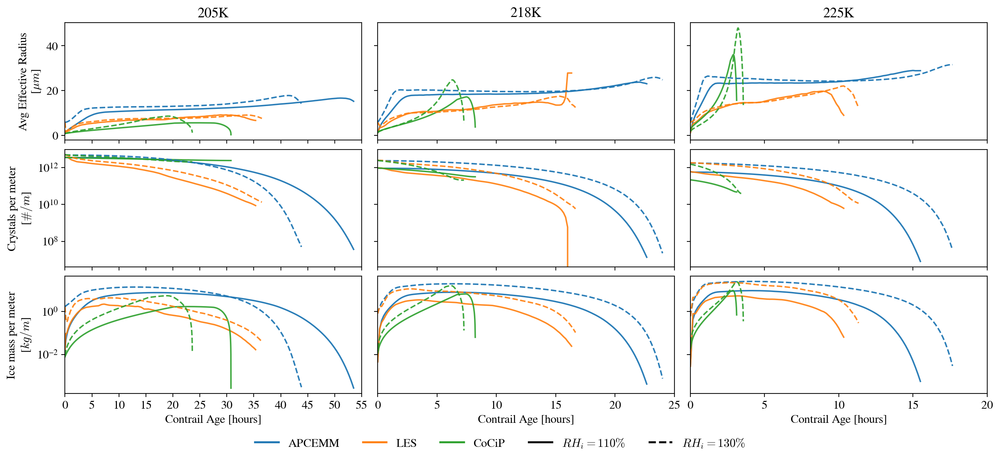

The first radius value for 130% 205K in LES is:  5.8
The first radius value for 130% 205K in CoCiP is:  0.7846912743569977
The first radius value for 130% 205K in APCEMM is:  5.828747870275861


In [13]:
from matplotlib.lines import Line2D
rho_ice = 917.0  # kg/m^3, used for CoCiP mass calculation

def get_apcemm_sauter_reff_um(ds):
    n = np.asarray(ds["Overall size distribution"]).squeeze().astype(float)
    r_e = np.asarray(ds["r_e"]).squeeze().astype(float)

    if r_e.size == n.size + 1:
        r_mid = 0.5 * (r_e[:-1] + r_e[1:])
    else:
        r_mid = r_e[:n.size]

    den = np.sum(n * r_mid**2)
    if den <= 0:
        return np.nan
    return (np.sum(n * r_mid**3) / den) * 1e6  # um


# 3 rows (reff, number, mass) x 3 cols (205K, 218K, 225K)
fig, axes = plt.subplots(
    3, 3, figsize=(14, 6), dpi=200,
    sharex='col', sharey='row', layout='constrained'
)

model_colors = {"APCEMM": "tab:blue", "LES": "tab:orange", "CoCiP": "tab:green"}
rh_styles = {110: "-", 130: "--"}

for j, temp in enumerate(temp_groups):
    ax_reff = axes[0, j]
    ax_num = axes[1, j]
    ax_mass = axes[2, j]

    ax_num.set_yscale("log")
    ax_mass.set_yscale("log")
    ax_reff.set_title(f"{temp}K")

    max_age = 0.0  # track max plotted age for this temperature column

    for rh in [110, 130]:
        tid = f"{rh}T{temp}L25"
        ls = rh_styles[rh]

        # APCEMM
        if tid in apcemm_bypass_data:
            ds_list = apcemm_bypass_data[tid]
            t_ap = np.arange(len(ds_list)) * 10 / 60
            r_ap_um = np.array([get_apcemm_sauter_reff_um(ds) for ds in ds_list], dtype=float)
            n_ap = np.array([ds["Number Ice Particles"].item() for ds in ds_list], dtype=float)
            m_ap = np.array([ds["Ice Mass"].item() for ds in ds_list], dtype=float)

            ax_reff.plot(t_ap, r_ap_um, color=model_colors["APCEMM"], linestyle=ls, alpha=0.95)
            ax_num.plot(t_ap, n_ap, color=model_colors["APCEMM"], linestyle=ls, alpha=0.95)
            ax_mass.plot(t_ap, m_ap, color=model_colors["APCEMM"], linestyle=ls, alpha=0.95)

            if t_ap.size:
                max_age = max(max_age, float(np.nanmax(t_ap)))

        # LES
        if tid in LES_data:
            t_les = LES_data[tid]["Time_hours"]

            if "Effective_radius_um" in LES_data[tid]:
                ax_reff.plot(
                    t_les,
                    LES_data[tid]["Effective_radius_um"],
                    color=model_colors["LES"], linestyle=ls, alpha=0.9
                )
            ax_num.plot(
                t_les,
                LES_data[tid]["Ice_number"],
                color=model_colors["LES"], linestyle=ls, alpha=0.9
            )
            ax_mass.plot(
                t_les,
                LES_data[tid]["Ice_mass"],
                color=model_colors["LES"], linestyle=ls, alpha=0.9
            )

            t_les_arr = np.asarray(t_les, dtype=float)
            if t_les_arr.size:
                max_age = max(max_age, float(np.nanmax(t_les_arr)))

        # CoCiP
        if tid in cocip_bypass_data:
            cds = cocip_bypass_data[tid]
            t_co = cds["age_hours"].values
            r_co_um = cds["r_ice_vol"].values * 1e6
            n_co = cds["n_ice_per_m"].values
            m_co = (4.0 / 3.0) * np.pi * rho_ice * (cds["r_ice_vol"].values**3) * n_co

            ax_reff.plot(t_co, r_co_um, color=model_colors["CoCiP"], linestyle=ls, alpha=0.9)
            ax_num.plot(t_co, n_co, color=model_colors["CoCiP"], linestyle=ls, alpha=0.9)
            ax_mass.plot(t_co, m_co, color=model_colors["CoCiP"], linestyle=ls, alpha=0.9)

            if t_co.size:
                max_age = max(max_age, float(np.nanmax(t_co)))

    # Set x-limits/ticks for this temperature column: ceil to nearest 5 h
    x_max = int(5 * np.ceil(max_age / 5.0)) if max_age > 0 else 5
    for ax in axes[:, j]:
        ax.set_xlim(0, x_max)
        ax.set_xticks(np.arange(0, x_max + 1, 5))
        ax.minorticks_off()

# Axis labels
axes[0, 0].set_ylabel("Avg Effective Radius\n[$\\mu m$]")
axes[1, 0].set_ylabel("Crystals per meter\n[$\\#/m$]")
axes[2, 0].set_ylabel("Ice mass per meter\n[$kg/m$]")
for j in range(3):
    axes[2, j].set_xlabel("Contrail Age [hours]")

# Legends: model=color, RH=linestyle
model_handles = [
    Line2D([0], [0], color=model_colors["APCEMM"], lw=2, linestyle="-", label="APCEMM"),
    Line2D([0], [0], color=model_colors["LES"], lw=2, linestyle="-", label="LES"),
    Line2D([0], [0], color=model_colors["CoCiP"], lw=2, linestyle="-", label="CoCiP"),
]
rh_handles = [
    Line2D([0], [0], color="k", lw=2, linestyle=rh_styles[110], label=r"$RH_i=110\%$"),
    Line2D([0], [0], color="k", lw=2, linestyle=rh_styles[130], label=r"$RH_i=130\%$"),
]

fig.legend(
    handles=model_handles + rh_handles,
    loc="lower center", bbox_to_anchor=(0.5, -0.075),
    ncol=5, frameon=False
)

plt.show()
print("The first radius value for 130% 205K in LES is: ", LES_data['130T205L25']["Effective_radius_um"].iloc[0])
print("The first radius value for 130% 205K in CoCiP is: ", cocip_bypass_data['130T205L25']["r_ice_vol"].values[0] * 1e6)
print("The first radius value for 130% 205K in APCEMM is: ", get_apcemm_sauter_reff_um(apcemm_bypass_data['130T205L25'][0]))

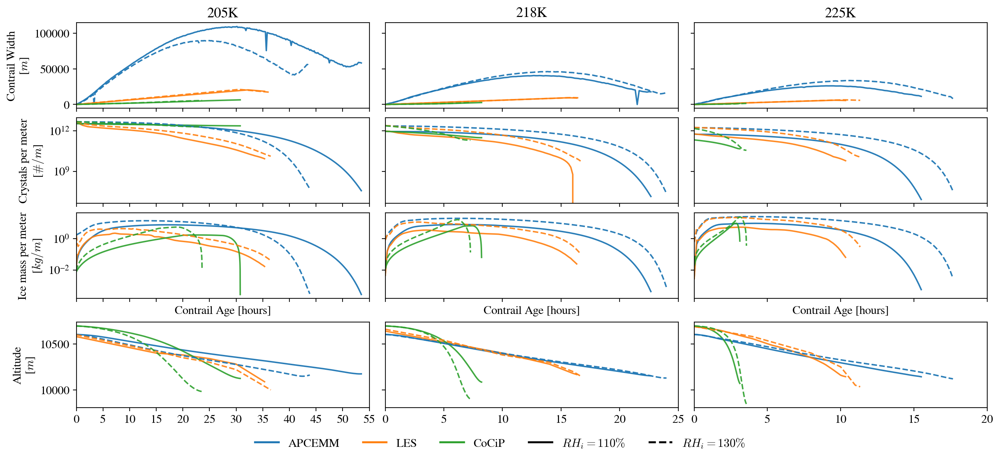

In [19]:
from matplotlib.lines import Line2D

def _extract_apcemm_centroid_altitude(ds):
    # Crystal-number-weighted mean altitude (contrail centroid) for one APCEMM timestep
    z = np.asarray(ds["Altitude"]).squeeze().astype(float)
    w = np.asarray(ds["Ice aerosol particle number"].sum(dim="x")).squeeze().astype(float)

    if z.size == 0 or w.size == 0:
        return np.nan

    n = min(z.size, w.size)
    z = z[:n]
    w = w[:n]

    wsum = np.nansum(w)
    if wsum <= 0:
        return np.nan

    return float(np.nansum(z * w) / wsum)


def _extract_apcemm_centroid_altitude_series(ds_list):
    return np.array([_extract_apcemm_centroid_altitude(ds) for ds in ds_list], dtype=float)

def _extract_width_from_apcemm_ds(ds):
    # xarray Dataset expected
    key = 'width'
    arr = np.asarray(ds[key]).squeeze()
    if arr.size == 0:
        return np.nan
    return float(arr.item() if arr.size == 1 else arr.flat[0])


def _extract_width_series_from_les(entry):
    # entry expected dict-like
    key = 'Width_m'
    if key is None:
        return None
    return np.asarray(entry[key], dtype=float)


def _extract_width_series_from_cocip(df):
    # df expected pandas DataFrame
    key = 'width'
    if key is None:
        return None
    return np.asarray(df[key].values, dtype=float)


# 4 rows (width, number, mass, altitude) x 3 cols (205K, 218K, 225K)
fig, axes = plt.subplots(
    4, 3, figsize=(14, 6), dpi=200,
    sharex='col', sharey='row', layout='constrained'
)

model_colors = {"APCEMM": "tab:blue", "LES": "tab:orange", "CoCiP": "tab:green"}
rh_styles = {110: "-", 130: "--"}

for j, temp in enumerate(temp_groups):
    ax_width = axes[0, j]
    ax_num = axes[1, j]
    ax_mass = axes[2, j]
    ax_alt = axes[3, j]

    ax_num.set_yscale("log")
    ax_mass.set_yscale("log")
    ax_width.set_title(f"{temp}K")

    max_age = 0.0

    for rh in [110, 130]:
        tid = f"{rh}T{temp}L25"
        ls = rh_styles[rh]

        # APCEMM
        if tid in apcemm_bypass_data:
            ds_list = apcemm_bypass_data[tid]
            t_ap = np.arange(len(ds_list)) * 10 / 60
            w_ap = np.array([_extract_width_from_apcemm_ds(ds) for ds in ds_list], dtype=float)
            n_ap = np.array([ds["Number Ice Particles"].item() for ds in ds_list], dtype=float)
            m_ap = np.array([ds["Ice Mass"].item() for ds in ds_list], dtype=float)
            a_ap = _extract_apcemm_centroid_altitude_series(ds_list)
            
            ax_alt.plot(t_ap, a_ap, color=model_colors["APCEMM"], linestyle=ls, alpha=0.95)
            if np.isfinite(w_ap).any():
                ax_width.plot(t_ap, w_ap, color=model_colors["APCEMM"], linestyle=ls, alpha=0.95)
            ax_num.plot(t_ap, n_ap, color=model_colors["APCEMM"], linestyle=ls, alpha=0.95)
            ax_mass.plot(t_ap, m_ap, color=model_colors["APCEMM"], linestyle=ls, alpha=0.95)

            if t_ap.size:
                max_age = max(max_age, float(np.nanmax(t_ap)))

        # LES
        if tid in LES_data:
            t_les = LES_data[tid]["Time_hours"]
            w_les = _extract_width_series_from_les(LES_data[tid])
            a_les = LES_data[tid]["Mean_altitude_m"].values.astype(float)

            ax_alt.plot(t_les, a_les, color=model_colors["LES"], linestyle=ls, alpha=0.9)
            if w_les is not None:
                ax_width.plot(t_les, w_les, color=model_colors["LES"], linestyle=ls, alpha=0.9)
            ax_num.plot(t_les, LES_data[tid]["Ice_number"], color=model_colors["LES"], linestyle=ls, alpha=0.9)
            ax_mass.plot(t_les, LES_data[tid]["Ice_mass"], color=model_colors["LES"], linestyle=ls, alpha=0.9)

            t_les_arr = np.asarray(t_les, dtype=float)
            if t_les_arr.size:
                max_age = max(max_age, float(np.nanmax(t_les_arr)))

        # CoCiP
        if tid in cocip_bypass_data:
            cds = cocip_bypass_data[tid]
            t_co = cds["age_hours"].values
            w_co = _extract_width_series_from_cocip(cds)
            a_co = cds["altitude"].values.astype(float)
            n_co = cds["n_ice_per_m"].values
            m_co = (4.0 / 3.0) * np.pi * rho_ice * (cds["r_ice_vol"].values**3) * n_co
            
            ax_alt.plot(t_co, a_co, color=model_colors["CoCiP"], linestyle=ls, alpha=0.9)
            if w_co is not None:
                ax_width.plot(t_co, w_co, color=model_colors["CoCiP"], linestyle=ls, alpha=0.9)
            ax_num.plot(t_co, n_co, color=model_colors["CoCiP"], linestyle=ls, alpha=0.9)
            ax_mass.plot(t_co, m_co, color=model_colors["CoCiP"], linestyle=ls, alpha=0.9)

            if t_co.size:
                max_age = max(max_age, float(np.nanmax(t_co)))

    x_max = int(5 * np.ceil(max_age / 5.0)) if max_age > 0 else 5
    for ax in axes[:, j]:
        ax.set_xlim(0, x_max)
        ax.set_xticks(np.arange(0, x_max + 1, 5))
        ax.minorticks_off()

# Axis labels
axes[0, 0].set_ylabel("Contrail Width\n[$m$]")
axes[1, 0].set_ylabel("Crystals per meter\n[$\\#/m$]")
axes[2, 0].set_ylabel("Ice mass per meter\n[$kg/m$]")
axes[3, 0].set_ylabel("Altitude\n[$m$]")
for j in range(3):
    axes[2, j].set_xlabel("Contrail Age [hours]")

# Legends: model=color, RH=linestyle
model_handles = [
    Line2D([0], [0], color=model_colors["APCEMM"], lw=2, linestyle="-", label="APCEMM"),
    Line2D([0], [0], color=model_colors["LES"], lw=2, linestyle="-", label="LES"),
    Line2D([0], [0], color=model_colors["CoCiP"], lw=2, linestyle="-", label="CoCiP"),
]
rh_handles = [
    Line2D([0], [0], color="k", lw=2, linestyle=rh_styles[110], label=r"$RH_i=110\%$"),
    Line2D([0], [0], color="k", lw=2, linestyle=rh_styles[130], label=r"$RH_i=130\%$"),
]

fig.legend(
    handles=model_handles + rh_handles,
    loc="lower center", bbox_to_anchor=(0.5, -0.075),
    ncol=5, frameon=False
)

plt.show()


### Mass and number ROC

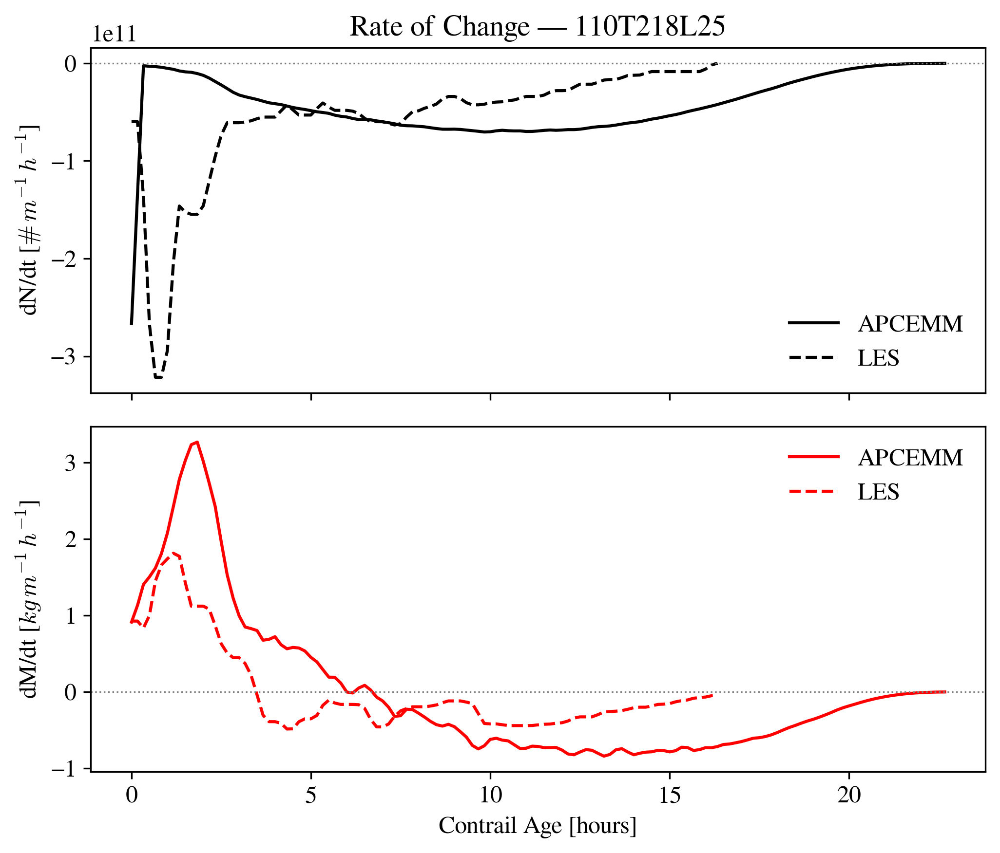

In [32]:
# Rate of change of ice crystal number and ice mass vs time (APCEMM vs LES vs CoCiP)

case_id = '110T218L25'  # choose a single case for this comparison

# --- APCEMM ---
ap_list = apcemm_bypass_data[case_id]
t_ap = np.arange(len(ap_list)) * (10.0 / 60.0)  # hours
n_ap = np.array([ds["Number Ice Particles"].item() for ds in ap_list], dtype=float)
m_ap = np.array([ds["Ice Mass"].item() for ds in ap_list], dtype=float)

dn_dt_ap = np.gradient(n_ap, t_ap)  # #/m per hour
dm_dt_ap = np.gradient(m_ap, t_ap)  # kg/m per hour

# --- LES ---
les_df = LES_data[case_id].copy()
t_les = les_df["Time_hours"].to_numpy(dtype=float)
n_les = les_df["Ice_number"].to_numpy(dtype=float)
m_les = les_df["Ice_mass"].to_numpy(dtype=float)

order = np.argsort(t_les)
t_les, n_les, m_les = t_les[order], n_les[order], m_les[order]

dn_dt_les = np.gradient(n_les, t_les)  # #/m per hour
dm_dt_les = np.gradient(m_les, t_les)  # kg/m per hour

# --- CoCiP ---
cds = cocip_bypass_data[case_id]
t_co = cds["age_hours"].values.astype(float)
n_co = cds["n_ice_per_m"].values.astype(float)

rho_ice = 917.0  # kg/m^3
r_co = cds["r_ice_vol"].values.astype(float)
m_co = n_co * (4.0 / 3.0) * np.pi * (r_co ** 3) * rho_ice  # kg/m

order = np.argsort(t_co)
t_co, n_co, m_co = t_co[order], n_co[order], m_co[order]

dn_dt_co = np.gradient(n_co, t_co)  # #/m per hour
dm_dt_co = np.gradient(m_co, t_co)  # kg/m per hour

# --- Plot ---
fig, axes = plt.subplots(2, 1, figsize=(7, 6), dpi=300, sharex=True)

axes[0].plot(t_ap, dn_dt_ap, color='black', linestyle='-', label='APCEMM')
axes[0].plot(t_les, dn_dt_les, color='black', linestyle='--', label='LES')
# axes[0].plot(t_co, dn_dt_co, color='black', linestyle=':', label='CoCiP')
axes[0].axhline(0, color='gray', lw=0.8, linestyle=':')
axes[0].set_ylabel(r'dN/dt [$\#\,m^{-1}\,h^{-1}$]')
axes[0].set_title(f'Rate of Change — {case_id}')
axes[0].legend(frameon=False)

axes[1].plot(t_ap, dm_dt_ap, color='red', linestyle='-', label='APCEMM')
axes[1].plot(t_les, dm_dt_les, color='red', linestyle='--', label='LES')
# axes[1].plot(t_co, dm_dt_co, color='red', linestyle=':', label='CoCiP')
axes[1].axhline(0, color='gray', lw=0.8, linestyle=':')
axes[1].set_ylabel(r'dM/dt [$kg\,m^{-1}\,h^{-1}$]')
axes[1].set_xlabel('Contrail Age [hours]')
axes[1].legend(frameon=False)

plt.tight_layout()
plt.show()

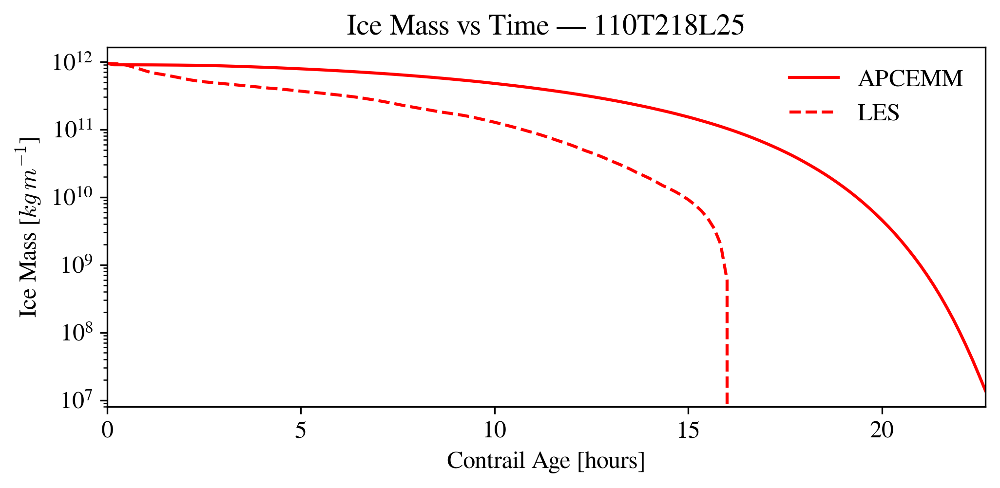

In [33]:
# --- Ice mass vs time (LES vs APCEMM) ---
plt.figure(figsize=(7, 3.5), dpi=300)
plt.plot(t_ap, n_ap, color='red', linestyle='-', label='APCEMM')
plt.plot(t_les, n_les, color='red', linestyle='--', label='LES')

plt.xlabel('Contrail Age [hours]')
plt.ylabel(r'Ice Mass [$kg\,m^{-1}$]')
plt.yscale('log')
plt.xlim(0, max(np.nanmax(t_ap), np.nanmax(t_les)))
plt.title(f'Ice Mass vs Time — {case_id}')
plt.legend(frameon=False)
plt.tight_layout()
plt.show()


### Single panel 

In [34]:
# Set figure and axis font size
plt.rcParams.update({'font.size': 11})

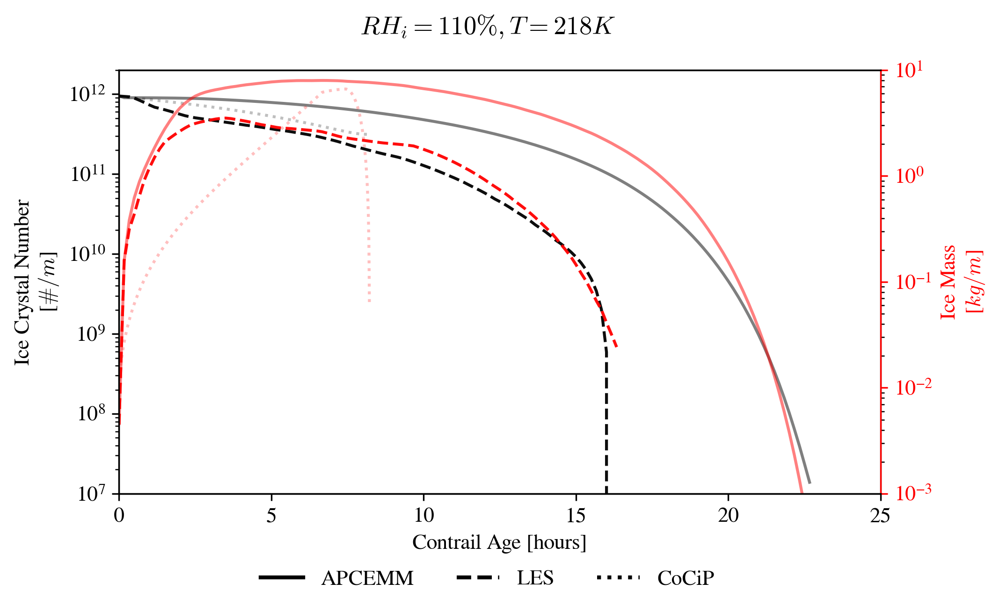

In [35]:
# Single-panel plot with shared x and double y-axis (110% RHi only)
fig, ax_num = plt.subplots(1, 1, figsize=(7, 4), dpi=300)
ax_mass = ax_num.twinx()

temp = '218'
tid = f'110T{temp}L25'
rho_ice = 917.0  # kg/m^3

# --- Ice Crystal Number (left y-axis, black) ---
if tid in apcemm_bypass_data:
    ds_list = apcemm_bypass_data[tid]
    t_ap = np.arange(len(ds_list)) * 10 / 60.0
    n_ap = [ds["Number Ice Particles"].item() for ds in ds_list]
    ax_num.plot(t_ap, n_ap, color='black', linestyle='-', alpha=0.5, label='APCEMM Number')

if tid in cocip_bypass_data:
    cds = cocip_bypass_data[tid]
    ax_num.plot(
        cds['age_hours'].values,
        cds['n_ice_per_m'].values,
        color='black',
        linestyle=':',
        alpha=0.25,
        label='CoCiP Number'
    )

if tid in LES_data:
    LES_number = LES_data[tid]['Ice_number']
    LES_times = LES_data[tid]['Time_hours']
    ax_num.plot(LES_times, LES_number, color='black', linestyle='--', alpha=0.95, label='LES Number')

# --- Ice Mass (right y-axis, red) ---
if tid in apcemm_bypass_data:
    ds_list = apcemm_bypass_data[tid]
    t_ap = np.arange(len(ds_list)) * 10 / 60.0
    m_ap = [ds["Ice Mass"].item() for ds in ds_list]
    ax_mass.plot(t_ap, m_ap, color='red', linestyle='-', alpha=0.5, label='APCEMM Mass')

if tid in cocip_bypass_data:
    cds = cocip_bypass_data[tid]
    n_ice = cds['n_ice_per_m'].values
    r_ice = cds['r_ice_vol'].values
    m_cocip = n_ice * (4.0 / 3.0) * np.pi * (r_ice ** 3) * rho_ice
    ax_mass.plot(
        cds['age_hours'].values,
        m_cocip,
        color='red',
        linestyle=':',
        alpha=0.25,
        label='CoCiP Mass'
    )

    # # altitude crossing marker (if CoCiP exists)
    # alt = cds['altitude'].values
    # t_cocip = cds['age_hours'].values
    # target_alt = 10700 - 500.0  # 10200 m
    # cross_idx = np.argmin(np.abs(alt - target_alt))
    # t_alt_m500 = t_cocip[cross_idx]
    # ax_num.axvline(t_alt_m500, color='0.4', linestyle='-', linewidth=0.6, alpha=0.7)

if tid in LES_data:
    LES_mass = LES_data[tid]['Ice_mass']
    LES_times = LES_data[tid]['Time_hours']
    ax_mass.plot(LES_times, LES_mass, color='red', linestyle='--', alpha=0.95, label='LES Mass')

# Axes formatting
ax_num.set_xlabel('Contrail Age [hours]')
ax_num.set_ylabel('Ice Crystal Number\n[$\\#/m$]', color='black')
ax_mass.set_ylabel('Ice Mass\n[$kg/m$]', color='red')

ax_num.set_yscale('log')
ax_mass.set_yscale('log')

ax_num.set_xlim(0, 25)
ax_num.set_ylim(1e7, 2e12)
ax_mass.set_ylim(1e-3, 10)

# Match tick/spine colors to line colors
ax_num.tick_params(axis='y', colors='black')
ax_mass.tick_params(axis='y', colors='red')
ax_num.spines['left'].set_color('black')
ax_mass.spines['right'].set_color('red')

# Combined legend
handles = [
    Line2D([0],[0], color='k', lw=2, linestyle='-', label='APCEMM'),
    Line2D([0],[0], color='k', lw=2, linestyle='--', label='LES'),
    Line2D([0],[0], color='k', lw=2, linestyle=':', label='CoCiP'),
]

# place combined legend at bottom center
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.08), ncol=len(handles), frameon=False)

fig.suptitle(r"$RH_i = 110\%, T = 218K$")
plt.show()


In [36]:
### 2D heatmap of CoCiP ice crystal number at a selected time index

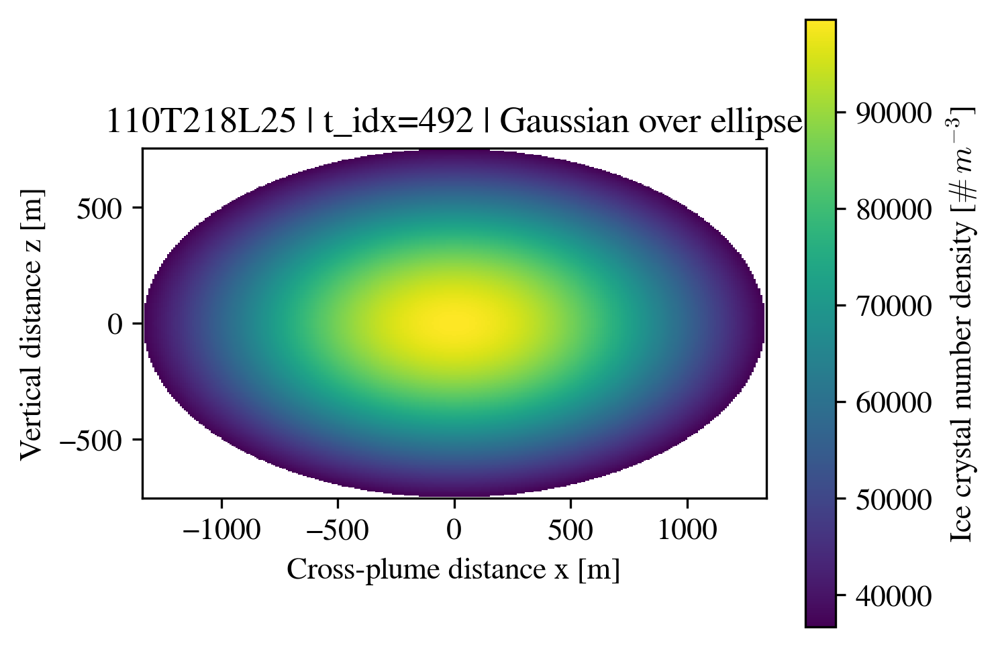

N_line target = 3.136e+11 #/m
Integrated (masked) = 1.982e+11 #/m
width=2672.88 m, depth=1500.00 m, area_eff=3148914.01 m², sx=945.01 m, sz=530.33 m


In [37]:
# 2D heatmap of CoCiP ice crystal number at a selected time index
time_idx = 492
case_id = tid if ('tid' in globals() and tid in cocip_bypass_data) else '110T218L25'
ds = cocip_bypass_data[case_id]

# CoCiP state at this time
N_line = float(ds['n_ice_per_m'].values[time_idx])   # total number per meter of contrail length [#/m]
width = float(ds['width'].values[time_idx])          # [m]
depth = float(ds['depth'].values[time_idx])          # [m]
A_eff = float(ds['area_eff'].values[time_idx])       # effective area [m^2]

# Assume anisotropic Gaussian in cross-section:
# n(x,z) = N_line/(2*pi*sx*sz) * exp(-0.5*(x/sx)^2 -0.5*(z/sz)^2)
# Use width/depth for axis ratio, and A_eff to set overall spread (skew/effective compactness).
ratio = max(width / depth, 1e-12)
sx = np.sqrt(A_eff * ratio / (2.0 * np.pi))
sz = np.sqrt(A_eff / (2.0 * np.pi * ratio))

# Grid over geometric ellipse bounds
x = np.linspace(-width / 2, width / 2, 300)
z = np.linspace(-depth / 2, depth / 2, 300)
X, Z = np.meshgrid(x, z)

n_2d = (N_line / (2.0 * np.pi * sx * sz)) * np.exp(-0.5 * ((X / sx) ** 2 + (Z / sz) ** 2))

# Optional mask outside geometric ellipse
ellipse_mask = (X / (width / 2))**2 + (Z / (depth / 2))**2 <= 1.0
n_2d_masked = np.where(ellipse_mask, n_2d, np.nan)

plt.figure(figsize=(5, 4), dpi=300)
im = plt.pcolormesh(X, Z, n_2d_masked, shading='auto', cmap='viridis')
plt.colorbar(im, label=r'Ice crystal number density [$\#\,m^{-3}$]')
plt.xlabel('Cross-plume distance x [m]')
plt.ylabel('Vertical distance z [m]')
plt.title(f'{case_id} | t_idx={time_idx} | Gaussian over ellipse')
plt.gca().set_aspect('equal')
plt.show()

# Quick consistency check: integral over plane should be close to N_line
dx = x[1] - x[0]
dz = z[1] - z[0]
N_check = np.nansum(n_2d_masked) * dx * dz
print(f"N_line target = {N_line:.3e} #/m")
print(f"Integrated (masked) = {N_check:.3e} #/m")
print(f"width={width:.2f} m, depth={depth:.2f} m, area_eff={A_eff:.2f} m², sx={sx:.2f} m, sz={sz:.2f} m")

### Initial condition print check

In [38]:
# Print ice crystal number and ice mass at the first timestep for each test plotted above
for tid in test_ids:
    print(f"--- {tid} ---")
    # APCEMM (first timestep)
    try:
        ds0 = apcemm_bypass_data[tid][0]
        apc_num = ds0["Number Ice Particles"].item()
        apc_mass = ds0["Ice Mass"].item()
        print(f"APCEMM  - Number: {apc_num:.6g}, Mass: {apc_mass:.6g}")
    except Exception:
        print("APCEMM  - not available")

    # LES (number)
    les_num = LES_data[tid]['Ice_number'][0]
    les_mass = LES_data[tid]['Ice_mass'][0]
    print(f"LES - Number: {les_num:.6g}, Mass: {les_mass:.6g}")
    # except Exception:
    #     print("LES - not available")

    # CoCiP (first timestep)
    if tid in cocip_bypass_data:
        cds = cocip_bypass_data[tid]
        try:
            n0 = cds['n_ice_per_m'].values[0]
            r0 = cds['r_ice_vol'].values[0]
            cocip_mass = n0 * (4/3 * np.pi * (r0**3)) * 917
            print(f"CoCiP  - Number: {n0:.6g}, Mass: {cocip_mass:.6g} (r={r0:.6g} m)")
        except Exception:
            print("CoCiP  - variables missing or not in expected form")
    else:
        print("CoCiP  - not available")

    print()

--- 110T205L25 ---
APCEMM  - Number: 3.58e+12, Mass: 0.0173333
LES - Number: 3.58e+12, Mass: 0.0169
CoCiP  - Number: 3.56832e+12, Mass: 0.00773279 (r=8.26301e-07 m)

--- 110T218L25 ---
APCEMM  - Number: 9.47e+11, Mass: 0.00458509
LES - Number: 9.47e+11, Mass: 0.0045
CoCiP  - Number: 9.43188e+11, Mass: 0.0116149 (r=1.47453e-06 m)

--- 110T225L25 ---
APCEMM  - Number: 5.88e+11, Mass: 0.00284692
LES - Number: 5.88e+11, Mass: 0.0028
CoCiP  - Number: 2.13606e+11, Mass: 0.0184021 (r=2.8201e-06 m)

--- 130T205L25 ---
APCEMM  - Number: 4.90563e+12, Mass: 1.67994
LES - Number: 4.90563e+12, Mass: 1.6337
CoCiP  - Number: 4.88896e+12, Mass: 0.00907342 (r=7.84691e-07 m)

--- 130T218L25 ---
APCEMM  - Number: 2.42845e+12, Mass: 0.831624
LES - Number: 2.42845e+12, Mass: 0.8088
CoCiP  - Number: 2.41627e+12, Mass: 0.0192049 (r=1.27429e-06 m)

--- 130T225L25 ---
APCEMM  - Number: 1.78821e+12, Mass: 0.612374
LES - Number: 1.78821e+12, Mass: 0.5955
CoCiP  - Number: 1.49766e+12, Mass: 0.0360379 (r=1.84344e-

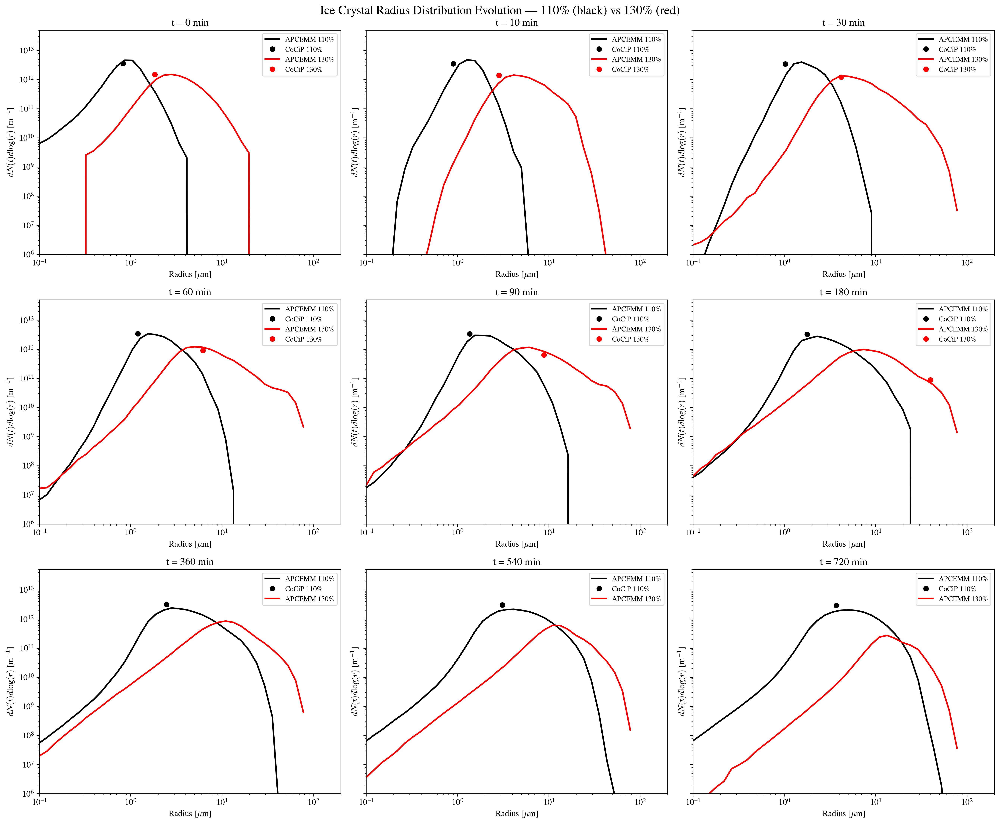

In [39]:
# Combined 3x3 comparison: 110% (black) vs 130% (red), otherwise same config
tests = ['110T205L25', '130T225L25']
colors = {'110': 'black', '130': 'red'}

plot_times_min = [0, 10, 30, 60, 90, 180, 360, 540, 720]
plot_indices = [int(t / 10) for t in plot_times_min]

radius_LES_csv = glob.glob('/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/LES/raw_data_from_plots/ice_crystal_radius/*.csv')

fig, axes = plt.subplots(3, 3, figsize=(18, 15), dpi=300, sharey=True)
axes = axes.flatten()

# Precompute LES file lists per test and sort by minute
les_files_map = {}
for t_id in tests:
    les_files_map[t_id] = sorted(
        [f for f in radius_LES_csv if t_id in f],
        key=lambda x: int(re.search(r'_(\d+)min\.csv$', x).group(1))
    )

# Keep LES scaling per test (computed at first panel where APCEMM is available)
scaling_map = {}

for i, idx in enumerate(plot_indices):
    ax = axes[i]
    for t_id in tests:
        color = colors[t_id[:3]]
        cocip_ds = cocip_bypass_data.get(t_id, None)

        # APCEMM (may raise if idx out of range; follow original behavior)
        try:
            ds = apcemm_bypass_data[t_id][idx]
        except Exception:
            # skip if APCEMM timestep not available
            continue

        r_um = ds['r'].values * 1e6
        size_dist = ds["Overall size distribution"].values #removeLow(ds["Overall size distribution"].values, cutoff=1e-6)
        ax.plot(r_um, size_dist, label=f"APCEMM {t_id[:3]}%", color=color, lw=2)

        # LES for this test
        les_files = les_files_map[t_id]
        if i < len(les_files):
            df = pd.read_csv(les_files[i], header=None)
            # compute scaling for this test at first panel when APCEMM exists
            if t_id not in scaling_map:
                scaling_map[t_id] = size_dist.max() / (df.iloc[:, 1].max() if df.iloc[:,1].max() > 0 else 1.0)
            ax.plot(df.iloc[:, 0], scaling_map[t_id] * df.iloc[:, 1], label=f"LES {t_id[:3]}%", color=color, linestyle='--', lw=2)

        # CoCiP point for this test (closest age)
        if cocip_ds is not None:
            t_hr = plot_times_min[i] / 60
            cocip_times = cocip_ds['age_hours'].values
            if t_hr < cocip_times[-1]:
                idx_cocip = (np.abs(cocip_times - t_hr)).argmin()
                ax.plot(
                    [cocip_ds['r_ice_vol'].values[idx_cocip] * 1e6],
                    [cocip_ds['n_ice_per_m'].values[idx_cocip]],
                    marker='o',
                    linestyle='',
                    color=color,
                    label=f"CoCiP {t_id[:3]}%"
                )

    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_xlim(1e-1, 2e2)
    ax.set_ylim(1e6, 5e13)
    ax.set_xlabel('Radius [$\\mu$m]')
    ax.set_ylabel('${dN(t)}{d\\log(r)}$ [m$^{-1}$]')
    ax.set_title(f't = {plot_times_min[i]} min' if i > 0 else 't = 0 min')

    # remove duplicate legend entries while preserving order
    handles, labels = ax.get_legend_handles_labels()
    unique = {}
    uniq_handles = []
    uniq_labels = []
    for h, l in zip(handles, labels):
        if l not in unique:
            unique[l] = True
            uniq_handles.append(h)
            uniq_labels.append(l)
    ax.legend(uniq_handles, uniq_labels, fontsize='small')

plt.suptitle('Ice Crystal Radius Distribution Evolution — 110% (black) vs 130% (red)', fontsize=16)
plt.tight_layout()
plt.show()


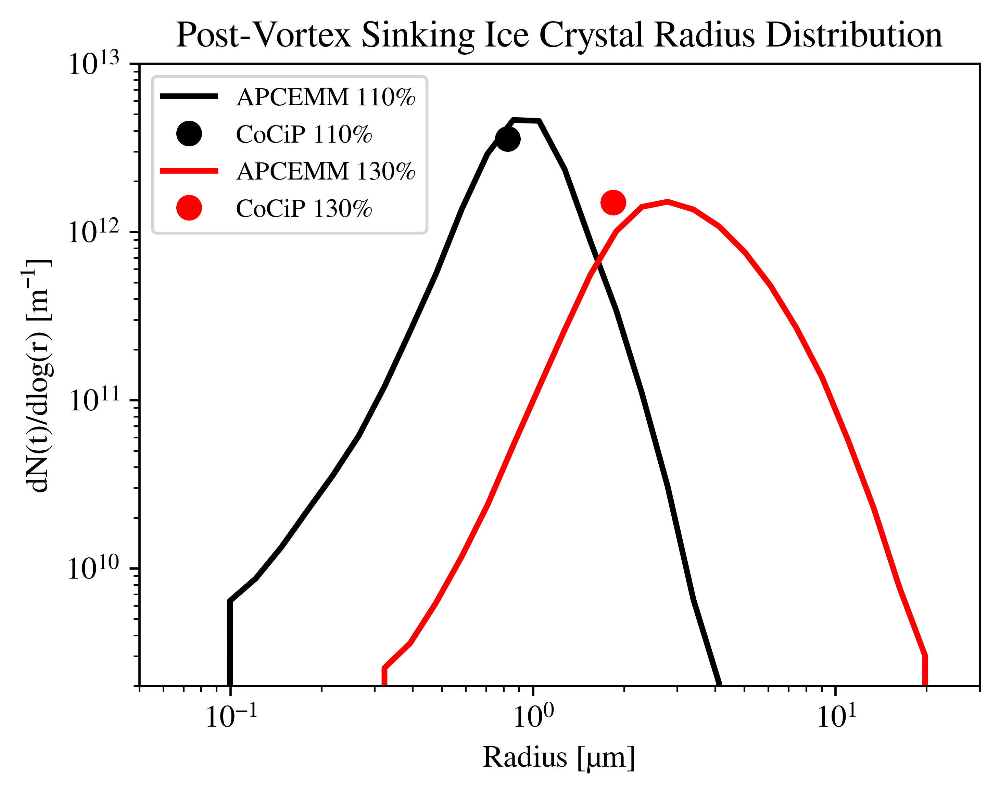

In [40]:
# Single frame comparison: 110% (black) vs 130% (red)
tests = ['110T205L25', '130T225L25']
colors = {'110': 'black', '130': 'red'}

fig, ax = plt.subplots(figsize=(5,4), dpi=600)

# Precompute LES file lists per test and sort by minute
les_files_map = {}
for t_id in tests:
    les_files_map[t_id] = sorted(
        [f for f in radius_LES_csv if t_id in f],
        key=lambda x: int(re.search(r'_(\d+)min\.csv$', x).group(1))
    )

scaling_map = {}

for t_id in tests:
    color = colors[t_id[:3]]
    cocip_ds = cocip_bypass_data.get(t_id, None)

    # APCEMM at t=0
    ds = apcemm_bypass_data[t_id][0]
    r_um = ds['r'].values * 1e6
    size_dist = ds["Overall size distribution"].values
    ax.plot(r_um, size_dist, label=f"APCEMM {t_id[:3]}%", color=color, lw=2)

    # LES at first file
    les_files = les_files_map[t_id]
    if les_files:
        df = pd.read_csv(les_files[0], header=None)
        scaling_map[t_id] = size_dist.max() / (df.iloc[:, 1].max() if df.iloc[:,1].max() > 0 else 1.0)
        ax.plot(df.iloc[:, 0], scaling_map[t_id] * df.iloc[:, 1], label=f"LES {t_id[:3]}%", color=color, linestyle='--', lw=2)

    # CoCiP at t=0
    if cocip_ds is not None:
        idx_cocip = 0
        ax.plot(
            [cocip_ds['r_ice_vol'].values[idx_cocip] * 1e6],
            [cocip_ds['n_ice_per_m'].values[idx_cocip]],
            marker='o',
            linestyle='',
            color=color,
            markersize=8,
            label=f"CoCiP {t_id[:3]}%"
        )

ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlim(0.5e-1, 3e1)
ax.set_ylim(2e9, 1e13)
ax.set_xlabel('Radius [µm]')
ax.set_ylabel('dN(t)/dlog(r) [m⁻¹]')
ax.set_title('Post-Vortex Sinking Ice Crystal Radius Distribution')
ax.legend(fontsize='small')

plt.tight_layout()
plt.show()


# RF Analysis

In [41]:
def _sum_rf_dfs(lw_df, sw_df, age_col='Contrail_Age_hours'):
    lw_rf_col = [c for c in lw_df.columns if 'Radiative' in c][0]
    sw_rf_col = [c for c in sw_df.columns if 'Radiative' in c][0]
    lw = lw_df.set_index(age_col)
    sw = sw_df.set_index(age_col).reindex(lw.index)
    out = lw.copy()
    out[lw_rf_col] = lw[lw_rf_col] + sw[sw_rf_col]
    return out.reset_index()

## CoCiP RF and EF Only

### CoCiP internal EF

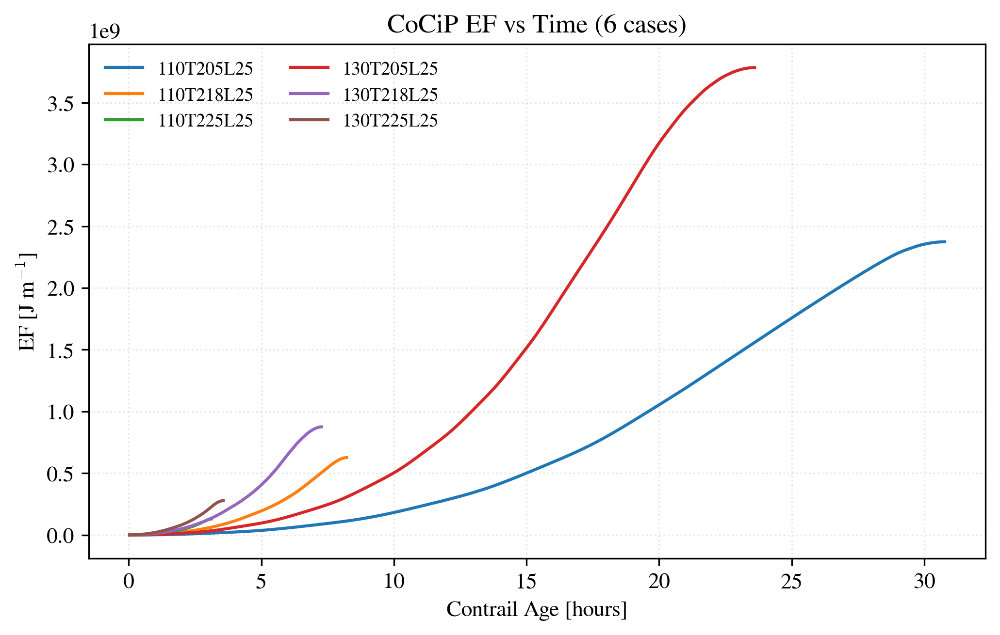

In [42]:
# CoCiP EF vs contrail age for all 6 cases
fig, ax = plt.subplots(figsize=(7, 4.5), dpi=300)

for tid in test_ids:
    if tid not in cocip_bypass_data:
        continue

    ds = cocip_bypass_data[tid]

    # time axis
    if "age_hours" in ds:
        t = ds["age_hours"].values.astype(float)
    elif "age" in ds:
        t = (ds["age"].values / np.timedelta64(1, "h")).astype(float)
    else:
        t = np.arange(ds.sizes["index"], dtype=float)

    # EF variable
    if "ef" not in ds:
        print(f"{tid}: missing 'ef' in dataset, skipped.")
        continue

    ef = np.cumsum(ds["ef"].values.astype(float)[1:]/ds["segment_length"].values.astype(float)[1:])  # cumulative sum to get total EF over time
    ax.plot(t[1:], ef, linewidth=1.5, label=tid)

ax.set_xlabel("Contrail Age [hours]")
ax.set_ylabel("EF [J m$^{-1}$]")
ax.set_title("CoCiP EF vs Time (6 cases)")
ax.grid(alpha=0.3, linestyle=":")
ax.legend(frameon=False, ncol=2, fontsize="small")
plt.tight_layout()
plt.show()

### CoCiP LRT EF

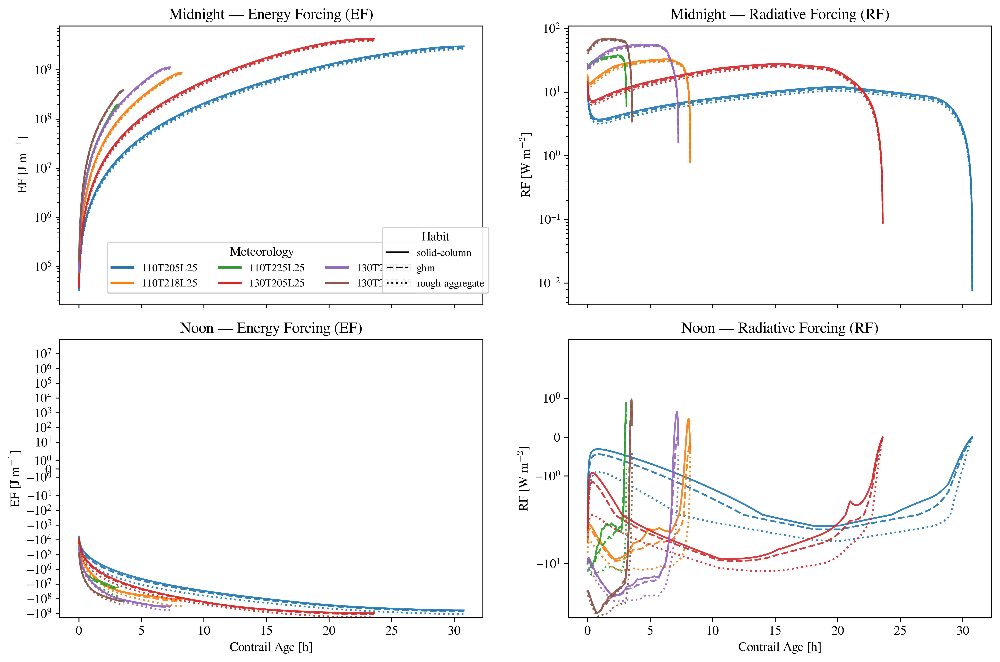

In [43]:
# Plot CoCiP-only EF and RF for all test_ids and all available habits

base_dir = '/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/CoCiP/RF_EF_results'

habits = ['solid-column', 'ghm', 'rough-aggregate']

# map habits to linestyles
linestyles_cycle = ['-', '--', ':', '-.']
linestyle_map = {h: linestyles_cycle[i % len(linestyles_cycle)] for i, h in enumerate(habits)}

# assign a distinct color per test_id
cmap = plt.get_cmap('tab10')
color_map_tid = {tid: cmap(i % cmap.N) for i, tid in enumerate(test_ids)}

fig, axes = plt.subplots(2, 2, figsize=(12, 8), dpi=600, sharex=True)
ax_0h_ef, ax_0h_rf = axes[0]
ax_12h_ef, ax_12h_rf = axes[1]

for tid in test_ids:
    for habit in habits:
        # EF files
        ef0_path = f"{base_dir}/{tid}/EF/{tid}_EF_{habit}_0h_LRT.csv"
        ef12_path = f"{base_dir}/{tid}/EF/{tid}_EF_{habit}_12h_LRT.csv"

        # RF files (LW and SW)
        lw0_path = f"{base_dir}/{tid}/RF/outputs/{tid}_LW_{habit}_0h_IWC.csv"
        sw0_path = f"{base_dir}/{tid}/RF/outputs/{tid}_SW_{habit}_0h_IWC.csv"
        lw12_path = f"{base_dir}/{tid}/RF/outputs/{tid}_LW_{habit}_12h_IWC.csv"
        sw12_path = f"{base_dir}/{tid}/RF/outputs/{tid}_SW_{habit}_12h_IWC.csv"

        color = color_map_tid[tid]
        ls = linestyle_map.get(habit, '-')

        # plot EF 0h
        if os.path.exists(ef0_path):
            try:
                ef0 = pd.read_csv(ef0_path)
                ax_0h_ef.plot(ef0['Contrail_Age_hours'], ef0['EF_J_m'], color=color, linestyle=ls, alpha=0.9)
            except Exception:
                pass

        # plot EF 12h
        if os.path.exists(ef12_path):
            try:
                ef12 = pd.read_csv(ef12_path)
                ax_12h_ef.plot(ef12['Contrail_Age_hours'], ef12['EF_J_m'], color=color, linestyle=ls, alpha=0.9)
            except Exception:
                pass

        # plot RF 0h (prefer LW if only LW present; if both LW and SW present, plot LW-SW net)
        plotted_0h_rf = False
        if os.path.exists(lw0_path) and os.path.exists(sw0_path):
            try:
                lw0 = pd.read_csv(lw0_path)
                sw0 = pd.read_csv(sw0_path)
                rf0 = _sum_rf_dfs(lw0, sw0)
                rf_col = [c for c in rf0.columns if 'Radiative' in c][0]
                ax_0h_rf.plot(rf0['Contrail_Age_hours'], rf0[rf_col], color=color, linestyle=ls, alpha=0.9)
                plotted_0h_rf = True
            except Exception:
                plotted_0h_rf = False
        if (not plotted_0h_rf) and os.path.exists(lw0_path):
            try:
                lw0 = pd.read_csv(lw0_path)
                lw_col = [c for c in lw0.columns if 'Radiative' in c][0]
                ax_0h_rf.plot(lw0['Contrail_Age_hours'], lw0[lw_col], color=color, linestyle=ls, alpha=0.9)
            except Exception:
                pass

        # plot RF 12h (use net LW-SW)
        if os.path.exists(lw12_path) and os.path.exists(sw12_path):
            try:
                lw12 = pd.read_csv(lw12_path)
                sw12 = pd.read_csv(sw12_path)
                rf12 = _sum_rf_dfs(lw12, sw12)
                rf_col12 = [c for c in rf12.columns if 'Radiative' in c][0]
                ax_12h_rf.plot(rf12['Contrail_Age_hours'], rf12[rf_col12], color=color, linestyle=ls, alpha=0.9)
            except Exception:
                pass

# labels and titles
ax_0h_ef.set_title('Midnight — Energy Forcing (EF)')
ax_12h_ef.set_title('Noon — Energy Forcing (EF)')
ax_0h_rf.set_title('Midnight — Radiative Forcing (RF)')
ax_12h_rf.set_title('Noon — Radiative Forcing (RF)')

ax_12h_ef.set_xlabel('Contrail Age [h]')
ax_12h_rf.set_xlabel('Contrail Age [h]')
ax_0h_ef.set_ylabel('EF [J m$^{-1}$]')
ax_12h_ef.set_ylabel('EF [J m$^{-1}$]')
ax_0h_rf.set_ylabel('RF [W m$^{-2}$]')
ax_12h_rf.set_ylabel('RF [W m$^{-2}$]')

ax_0h_ef.set_yscale('log')
ax_12h_ef.set_yscale('symlog')
ax_0h_rf.set_yscale('log')
ax_12h_rf.set_yscale('symlog')

ax_12h_ef.minorticks_off()
ax_12h_rf.minorticks_off()

# create legend handles: one for test_ids (colors) and one for habits (linestyles)
test_handles = [Line2D([0], [0], color=color_map_tid[tid], lw=2, label=tid) for tid in test_ids]
habit_handles = [Line2D([0], [0], color='k', lw=1.5, linestyle=linestyle_map[h], label=h) for h in habits]

# place legends
# place two legends side-by-side in the first subplot
leg1 = axes[0,0].legend(handles=test_handles, title='Meteorology', fontsize='small',
                       ncol=3, loc='lower left', bbox_to_anchor=(0.1, 0.02))
axes[0,0].add_artist(leg1)
leg2 = axes[0,0].legend(handles=habit_handles, title='Habit', fontsize='small',
                       ncol=1, loc='lower left', bbox_to_anchor=(0.75, 0.02))
leg1.get_frame().set_alpha(0.9)
leg2.get_frame().set_alpha(0.9)

plt.tight_layout()
plt.show()

### Overlay of EF sources

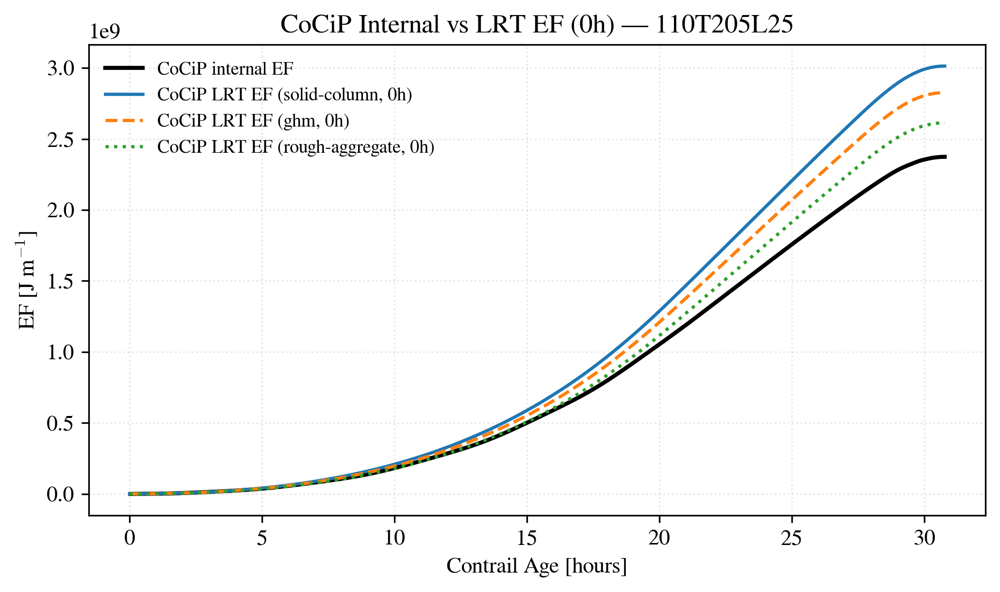

EF values at t=4.0 hours for 110T205L25:
  CoCiP internal EF: 2.378e+07 J/m


In [44]:
# Overlay CoCiP internal EF and CoCiP LRT EF (0h) with single y-axis
case_id = '110T205L25'
ds = cocip_bypass_data[case_id]

# CoCiP internal EF
t_internal = ds["age_hours"].values.astype(float)[1:]
ef_internal = np.cumsum(ds["ef"].values.astype(float)[1:]/ds["segment_length"].values.astype(float)[1:])

# CoCiP LRT EF files (0h)
habits = ["solid-column", "ghm", "rough-aggregate"]
linestyle_map = {"solid-column": "-", "ghm": "--", "rough-aggregate": ":"}

fig, ax = plt.subplots(figsize=(7, 4.2), dpi=300)

# Internal EF
line_internal, = ax.plot(
    t_internal, ef_internal, color="black", linewidth=2, label="CoCiP internal EF"
)

# LRT EF by habit
lrt_colors = {"solid-column": "tab:blue", "ghm": "tab:orange", "rough-aggregate": "tab:green"}
lrt_lines = []
found_any = False

for h in habits:
    ef_path = f"{base_dir}/{case_id}/EF/{case_id}_EF_{h}_0h_LRT.csv"
    if os.path.exists(ef_path):
        try:
            ef_df = pd.read_csv(ef_path)
            ln, = ax.plot(
                ef_df["Contrail_Age_hours"],
                ef_df["EF_J_m"],
                color=lrt_colors[h],
                linestyle=linestyle_map[h],
                linewidth=1.6,
                label=f"CoCiP LRT EF ({h}, 0h)"
            )
            lrt_lines.append(ln)
            found_any = True
        except Exception:
            pass

if not found_any:
    print(f"No CoCiP LRT EF 0h files found for {case_id}")

ax.set_xlabel("Contrail Age [hours]")
ax.set_ylabel("EF [J m$^{-1}$]")
ax.grid(alpha=0.3, linestyle=":")
ax.set_title(f"CoCiP Internal vs LRT EF (0h) — {case_id}")
# ax.set_ylim(0, 0.2e8)

handles = [line_internal] + lrt_lines
labels = [h.get_label() for h in handles]
ax.legend(handles, labels, frameon=False, fontsize="small", loc="upper left")

plt.tight_layout()
plt.show()

# Print the EF value for each line plotted at t=4 hours
target_time = 4.0  # hours
print(f"EF values at t={target_time} hours for {case_id}:")
# CoCiP internal EF
if t_internal.size > 0 and ef_internal.size > 0:
    ef_at_target = np.interp(target_time, t_internal, ef_internal)
    print(f"  CoCiP internal EF: {ef_at_target:.3e} J/m")
else:
    print("  CoCiP internal EF: data not available")

## APCEMM RF and EF Only

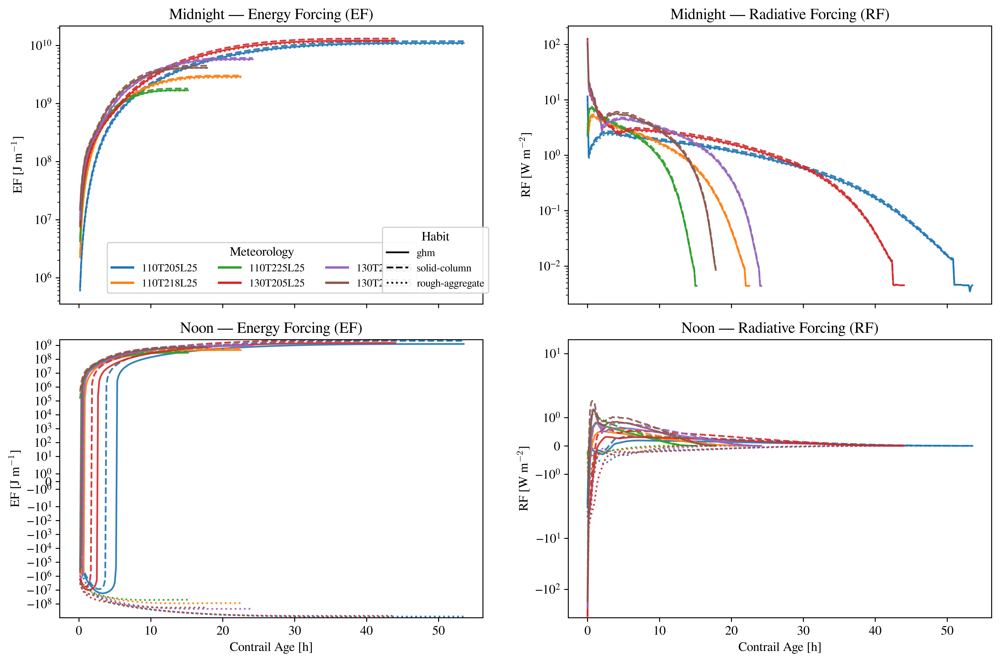

In [45]:
# Plot APCEMM-only EF and RF for all test_ids and all available habits

base_dir = '/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/APCEMM/RF_EF_results'

habits = ['ghm', 'solid-column', 'rough-aggregate']

# map habits to linestyles
linestyles_cycle = ['-', '--', ':', '-.']
linestyle_map = {h: linestyles_cycle[i % len(linestyles_cycle)] for i, h in enumerate(habits)}

# assign a distinct color per test_id
cmap = plt.get_cmap('tab10')
color_map_tid = {tid: cmap(i % cmap.N) for i, tid in enumerate(test_ids)}

fig, axes = plt.subplots(2, 2, figsize=(12, 8), dpi=600, sharex=True)
ax_0h_ef, ax_0h_rf = axes[0]
ax_12h_ef, ax_12h_rf = axes[1]

for tid in test_ids:
    for habit in habits:
        # EF files
        ef0_path = f"{base_dir}/{tid}/EF/{tid}_EF_{habit}_0h_LRT.csv"
        ef12_path = f"{base_dir}/{tid}/EF/{tid}_EF_{habit}_12h_LRT.csv"

        # RF files (LW and SW)
        lw0_path = f"{base_dir}/{tid}/RF/outputs/LW_RF_APCEMM_{habit}_0h_IWC_{tid}.csv"
        sw0_path = f"{base_dir}/{tid}/RF/outputs/SW_RF_APCEMM_{habit}_0h_IWC_{tid}.csv"
        lw12_path = f"{base_dir}/{tid}/RF/outputs/LW_RF_APCEMM_{habit}_12h_IWC_{tid}.csv"
        sw12_path = f"{base_dir}/{tid}/RF/outputs/SW_RF_APCEMM_{habit}_12h_IWC_{tid}.csv"

        color = color_map_tid[tid]
        ls = linestyle_map.get(habit, '-')

        # plot EF 0h (skip first row)
        if os.path.exists(ef0_path):
            try:
                ef0 = pd.read_csv(ef0_path)
                ax_0h_ef.plot(ef0['Contrail_Age_hours'], ef0['EF_J_m'], color=color, linestyle=ls, alpha=0.9)
            except Exception:
                pass

        # plot EF 12h (skip first row)
        if os.path.exists(ef12_path):
            try:
                ef12 = pd.read_csv(ef12_path)
                ax_12h_ef.plot(ef12['Contrail_Age_hours'], ef12['EF_J_m'], color=color, linestyle=ls, alpha=0.9)
            except Exception:
                pass

        # plot RF 0h (prefer LW if only LW present; if both LW and SW present, plot LW-SW net) — skip first row
        plotted_0h_rf = False
        if os.path.exists(lw0_path) and os.path.exists(sw0_path):
            try:
                lw0 = pd.read_csv(lw0_path)
                sw0 = pd.read_csv(sw0_path)
                rf0 = _sum_rf_dfs(lw0, sw0)
                rf_col = [c for c in rf0.columns if 'Radiative' in c][0]
                ax_0h_rf.plot(rf0['Contrail_Age_hours'], rf0[rf_col], color=color, linestyle=ls, alpha=0.9)
                plotted_0h_rf = True
            except Exception:
                plotted_0h_rf = False
        if (not plotted_0h_rf) and os.path.exists(lw0_path):
            try:
                lw0 = pd.read_csv(lw0_path)
                lw_col = [c for c in lw0.columns if 'Radiative' in c][0]
                ax_0h_rf.plot(lw0['Contrail_Age_hours'], lw0[lw_col], color=color, linestyle=ls, alpha=0.9)
            except Exception:
                pass

        # plot RF 12h (use net LW+SW) — skip first row
        if os.path.exists(lw12_path) and os.path.exists(sw12_path):
            try:
                lw12 = pd.read_csv(lw12_path)
                sw12 = pd.read_csv(sw12_path)
                rf12 = _sum_rf_dfs(lw12, sw12)
                rf_col12 = [c for c in rf12.columns if 'Radiative' in c][0]
                ax_12h_rf.plot(rf12['Contrail_Age_hours'], rf12[rf_col12], color=color, linestyle=ls, alpha=0.9)
            except Exception:
                pass

# labels and titles
ax_0h_ef.set_title('Midnight — Energy Forcing (EF)')
ax_12h_ef.set_title('Noon — Energy Forcing (EF)')
ax_0h_rf.set_title('Midnight — Radiative Forcing (RF)')
ax_12h_rf.set_title('Noon — Radiative Forcing (RF)')

ax_12h_ef.set_xlabel('Contrail Age [h]')
ax_12h_rf.set_xlabel('Contrail Age [h]')
ax_0h_ef.set_ylabel('EF [J m$^{-1}$]')
ax_12h_ef.set_ylabel('EF [J m$^{-1}$]')
ax_0h_rf.set_ylabel('RF [W m$^{-2}$]')
ax_12h_rf.set_ylabel('RF [W m$^{-2}$]')

ax_0h_ef.set_yscale('log')
ax_12h_ef.set_yscale('symlog')
ax_0h_rf.set_yscale('log')
ax_12h_rf.set_yscale('symlog')

# create legend handles: one for test_ids (colors) and one for habits (linestyles)
test_handles = [Line2D([0], [0], color=color_map_tid[tid], lw=2, label=tid) for tid in test_ids]
habit_handles = [Line2D([0], [0], color='k', lw=1.5, linestyle=linestyle_map[h], label=h) for h in habits]

# place legends
# place two legends side-by-side in the first subplot
leg1 = axes[0,0].legend(handles=test_handles, title='Meteorology', fontsize='small',
                       ncol=3, loc='lower left', bbox_to_anchor=(0.1, 0.02))
axes[0,0].add_artist(leg1)
leg2 = axes[0,0].legend(handles=habit_handles, title='Habit', fontsize='small',
                       ncol=1, loc='lower left', bbox_to_anchor=(0.75, 0.02))
leg1.get_frame().set_alpha(0.9)
leg2.get_frame().set_alpha(0.9)

plt.tight_layout()
plt.show()

## LLES RF and EF Only

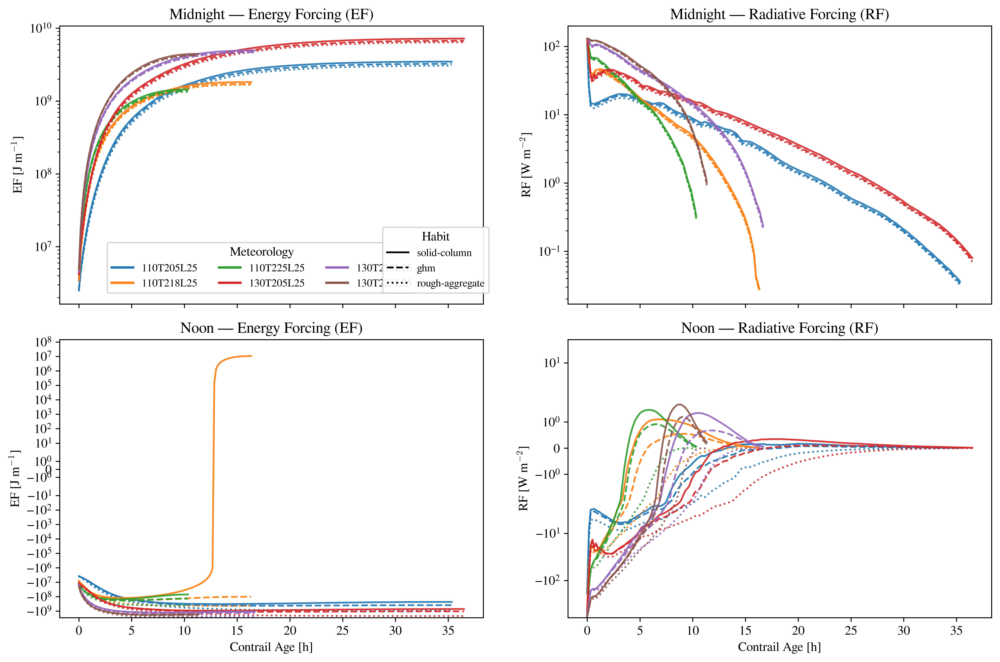

In [46]:
# Plot LES-only EF and RF for all test_ids and all available habits

base_dir = '/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/LES/RF_EF_results'

habits = ['solid-column', 'ghm', 'rough-aggregate']

# map habits to linestyles
linestyles_cycle = ['-', '--', ':', '-.']
linestyle_map = {h: linestyles_cycle[i % len(linestyles_cycle)] for i, h in enumerate(habits)}

# assign a distinct color per test_id
cmap = plt.get_cmap('tab10')
color_map_tid = {tid: cmap(i % cmap.N) for i, tid in enumerate(test_ids)}

fig, axes = plt.subplots(2, 2, figsize=(12, 8), dpi=600, sharex=True)
ax_0h_ef, ax_0h_rf = axes[0]
ax_12h_ef, ax_12h_rf = axes[1]

for tid in test_ids:
    for habit in habits:
        # EF files
        ef0_path = f"{base_dir}/{tid}/EF/{tid}_EF_{habit}_0h_LRT.csv"
        ef12_path = f"{base_dir}/{tid}/EF/{tid}_EF_{habit}_12h_LRT.csv"

        # RF files (LW and SW)
        lw0_path = f"{base_dir}/{tid}/RF/outputs/LW_RF_LES_{habit}_0h_IWC_{tid}.csv"
        sw0_path = f"{base_dir}/{tid}/RF/outputs/SW_RF_LES_{habit}_0h_IWC_{tid}.csv"
        lw12_path = f"{base_dir}/{tid}/RF/outputs/LW_RF_LES_{habit}_12h_IWC_{tid}.csv"
        sw12_path = f"{base_dir}/{tid}/RF/outputs/SW_RF_LES_{habit}_12h_IWC_{tid}.csv"

        color = color_map_tid[tid]
        ls = linestyle_map.get(habit, '-')

        # plot EF 0h
        if os.path.exists(ef0_path):
            try:
                ef0 = pd.read_csv(ef0_path)
                ax_0h_ef.plot(ef0['Contrail_Age_hours'], ef0['EF_J_m'], color=color, linestyle=ls, alpha=0.9)
            except Exception:
                pass

        # plot EF 12h
        if os.path.exists(ef12_path):
            try:
                ef12 = pd.read_csv(ef12_path)
                ax_12h_ef.plot(ef12['Contrail_Age_hours'], ef12['EF_J_m'], color=color, linestyle=ls, alpha=0.9)
            except Exception:
                pass

        # plot RF 0h (prefer LW if only LW present; if both LW and SW present, plot LW-SW net)
        plotted_0h_rf = False
        if os.path.exists(lw0_path) and os.path.exists(sw0_path):
            try:
                lw0 = pd.read_csv(lw0_path)
                sw0 = pd.read_csv(sw0_path)
                rf0 = _sum_rf_dfs(lw0, sw0)
                rf_col = [c for c in rf0.columns if 'Radiative' in c][0]
                ax_0h_rf.plot(rf0['Contrail_Age_hours'], rf0[rf_col], color=color, linestyle=ls, alpha=0.9)
                plotted_0h_rf = True
            except Exception:
                plotted_0h_rf = False
        if (not plotted_0h_rf) and os.path.exists(lw0_path):
            try:
                lw0 = pd.read_csv(lw0_path)
                lw_col = [c for c in lw0.columns if 'Radiative' in c][0]
                ax_0h_rf.plot(lw0['Contrail_Age_hours'], lw0[lw_col], color=color, linestyle=ls, alpha=0.9)
            except Exception:
                pass

        # plot RF 12h (use net LW-SW)
        if os.path.exists(lw12_path) and os.path.exists(sw12_path):
            try:
                lw12 = pd.read_csv(lw12_path)
                sw12 = pd.read_csv(sw12_path)
                rf12 = _sum_rf_dfs(lw12, sw12)
                rf_col12 = [c for c in rf12.columns if 'Radiative' in c][0]
                ax_12h_rf.plot(rf12['Contrail_Age_hours'], rf12[rf_col12], color=color, linestyle=ls, alpha=0.9)
            except Exception:
                pass

# labels and titles
ax_0h_ef.set_title('Midnight — Energy Forcing (EF)')
ax_12h_ef.set_title('Noon — Energy Forcing (EF)')
ax_0h_rf.set_title('Midnight — Radiative Forcing (RF)')
ax_12h_rf.set_title('Noon — Radiative Forcing (RF)')

ax_12h_ef.set_xlabel('Contrail Age [h]')
ax_12h_rf.set_xlabel('Contrail Age [h]')
ax_0h_ef.set_ylabel('EF [J m$^{-1}$]')
ax_12h_ef.set_ylabel('EF [J m$^{-1}$]')
ax_0h_rf.set_ylabel('RF [W m$^{-2}$]')
ax_12h_rf.set_ylabel('RF [W m$^{-2}$]')

ax_0h_ef.set_yscale('log')
ax_12h_ef.set_yscale('symlog')
ax_0h_rf.set_yscale('log')
ax_12h_rf.set_yscale('symlog')

ax_12h_ef.minorticks_off()
ax_12h_rf.minorticks_off()

# create legend handles: one for test_ids (colors) and one for habits (linestyles)
test_handles = [Line2D([0], [0], color=color_map_tid[tid], lw=2, label=tid) for tid in test_ids]
habit_handles = [Line2D([0], [0], color='k', lw=1.5, linestyle=linestyle_map[h], label=h) for h in habits]

# place legends
# place two legends side-by-side in the first subplot
leg1 = axes[0,0].legend(handles=test_handles, title='Meteorology', fontsize='small',
                       ncol=3, loc='lower left', bbox_to_anchor=(0.1, 0.02))
axes[0,0].add_artist(leg1)
leg2 = axes[0,0].legend(handles=habit_handles, title='Habit', fontsize='small',
                       ncol=1, loc='lower left', bbox_to_anchor=(0.75, 0.02))
leg1.get_frame().set_alpha(0.9)
leg2.get_frame().set_alpha(0.9)

plt.tight_layout()
plt.show()

# All models EF/RF

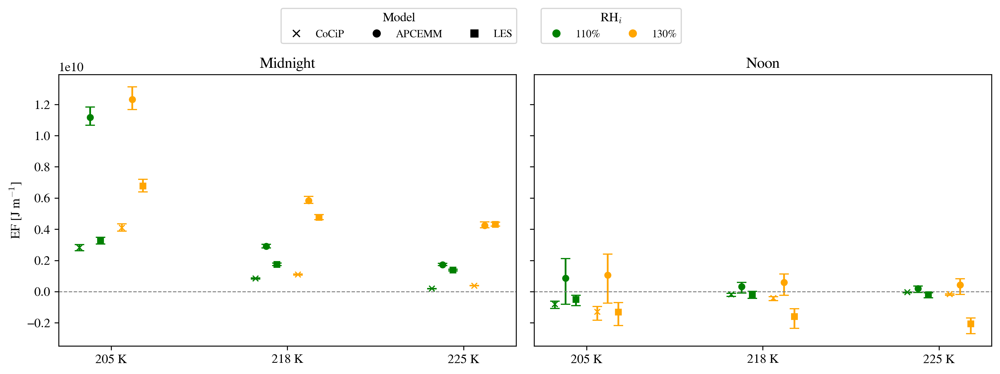

In [47]:
# aggregate final EF values per test case (tid) and model, then plot per-case mean ± min/max
base_apcemm = '/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/APCEMM/RF_EF_results'
base_cocip  = '/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/CoCiP/RF_EF_results'
base_les    = '/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/LES/RF_EF_results'

time_tags = ['0h', '12h']
habits = ['solid-column', 'ghm', 'rough-aggregate']
models = {'APCEMM': base_apcemm, 'CoCiP': base_cocip, 'LES': base_les}

# collect per-case per-model per-time final EF values
tid_colors = {tid: cm.get_cmap('tab10')(i % 10) for i, tid in enumerate(test_ids)}
per_case = {tid: {m: {tt: [] for tt in time_tags} for m in models} for tid in test_ids}

for m, base in models.items():
    apcemm_style = (m == 'APCEMM')
    for tid in test_ids:
        for h in habits:
            for tt in time_tags:
                ef_path = f"{base}/{tid}/EF/{tid}_EF_{h}_{tt}_LRT.csv"
                if os.path.exists(ef_path):
                    try:
                        df_ = pd.read_csv(ef_path)
                        if 'EF_J_m' in df_.columns and len(df_) > 0:
                            series = df_['EF_J_m'].dropna()
                            if apcemm_style and len(series) > 1:
                                series = series.iloc[1:]
                            if len(series) > 0:
                                per_case[tid][m][tt].append(float(series.iloc[-1]))
                    except Exception:
                        pass

# compute stats (mean/min/max) per case
stats_case = {tid: {m: {tt: None for tt in time_tags} for m in models} for tid in test_ids}
for tid in test_ids:
    for m in models:
        for tt in time_tags:
            vals = np.array(per_case[tid][m][tt], dtype=float)
            if vals.size:
                stats_case[tid][m][tt] = {'mean': vals.mean(), 'min': vals.min(), 'max': vals.max()}

# --- plotting: split 0h and 12h into separate subplots ---
# --- plotting: cluster by temperature (205K, 218K, 225K) ---
fig, axes = plt.subplots(1, 2, figsize=(12, 4), dpi=300, sharey=True)

model_order = ['CoCiP', 'APCEMM', 'LES']
marker_map = {'APCEMM': 'o', 'CoCiP': 'x', 'LES': 's'}
model_offset = {'CoCiP': -0.06, 'APCEMM': 0.0, 'LES': 0.06}
time_tags = ['0h', '12h']

# choose coloring mode: 'rh' or 'time'
rh_color = {'110': 'green', '130': 'orange'}

temps_unique = sorted({int(tid.split('T')[1].split('L')[0]) for tid in test_ids})
x_temp = np.arange(len(temps_unique))
temp_to_x = {T: i for i, T in enumerate(temps_unique)}

tids_by_temp = {
    T: sorted(
        [tid for tid in test_ids if f'T{T}' in tid],
        key=lambda s: int(s[:3])
    )
    for T in temps_unique
}

case_offsets_map = {}
for T in temps_unique:
    n = len(tids_by_temp[T])
    if n == 1:
        case_offsets_map[T] = {tids_by_temp[T][0]: 0.0}
    else:
        offs = np.linspace(-0.12, 0.12, n)
        case_offsets_map[T] = {tid: off for tid, off in zip(tids_by_temp[T], offs)}

for ax, tt, title in zip(axes, time_tags, ['Midnight', 'Noon']):
    for T in temps_unique:
        x0 = temp_to_x[T]
        for tid in tids_by_temp[T]:
            for m in model_order:
                s = stats_case[tid][m].get(tt)
                if s is None:
                    continue

                x = x0 + case_offsets_map[T][tid] + model_offset[m]
                y = s['mean']
                yerr = np.array([[y - s['min']], [s['max'] - y]])

                c = rh_color.get(tid[:3], 'black')

                ax.errorbar(
                    x, y, yerr=yerr,
                    fmt=marker_map[m],
                    color=c,
                    capsize=4, markersize=5, linestyle=''
                )
    ax.axhline(0, color='gray', linestyle='--', lw=0.8)
    ax.set_title(title)
    ax.set_xticks(x_temp)
    ax.set_xticklabels([f'{T} K' for T in temps_unique])

axes[0].set_ylabel('EF [J m$^{-1}$]')

# legend: marker = model
model_handles = [Line2D([0], [0], marker=marker_map[m], color='k', lw=0, label=m) for m in model_order]
fig.legend(handles=model_handles, title='Model', loc='upper center', ncol=3, bbox_to_anchor=(0.4, 1.12), fontsize='small')

# legend:
color_handles = [
    Line2D([0], [0], marker='o', color='green', lw=0, label='110%'),
    Line2D([0], [0], marker='o', color='orange', lw=0, label='130%'),
]
legend_title = 'RH$_i$'

fig.legend(handles=color_handles, title=legend_title, loc='upper center', ncol=2, bbox_to_anchor=(0.61, 1.12), fontsize='small')

plt.tight_layout()
plt.show()

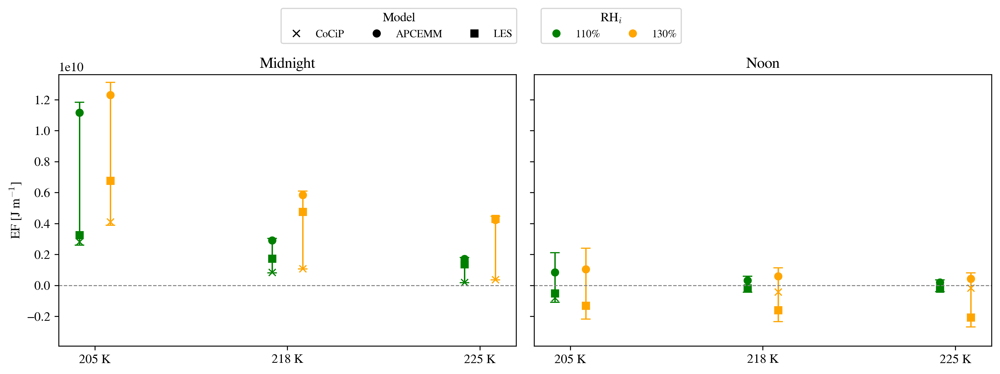

In [48]:
# plotting: split 0h and 12h into separate subplots, clustered by temperature
fig, axes = plt.subplots(1, 2, figsize=(12, 4), dpi=300, sharey=True)

temps_unique = sorted({int(tid.split('T')[1].split('L')[0]) for tid in test_ids})
x_temp = np.arange(len(temps_unique))
temp_to_x = {T: i for i, T in enumerate(temps_unique)}

tids_by_temp = {
    T: sorted([tid for tid in test_ids if f'T{T}' in tid], key=lambda s: int(s[:3]))
    for T in temps_unique
}

case_offsets_map = {}
for T in temps_unique:
    n = len(tids_by_temp[T])
    if n == 1:
        case_offsets_map[T] = {tids_by_temp[T][0]: 0.0}
    else:
        offs = np.linspace(-0.08, 0.08, n)
        case_offsets_map[T] = {tid: off for tid, off in zip(tids_by_temp[T], offs)}

# marker per model (same color as RH, different marker shape)
model_order = ['CoCiP', 'APCEMM', 'LES']
model_markers = {'APCEMM': 'o', 'CoCiP': 'x', 'LES': 's'}

# precompute percentage differences per case/
pct_diff_case = {}
all_ymins, all_ymaxs = [], []
for tid in test_ids:
    for tt in time_tags:
        vals = []
        mins = []
        maxs = []
        for m in models:
            s = stats_case[tid][m].get(tt)
            if s is not None:
                vals.append(s["mean"])
                mins.append(s["min"])
                maxs.append(s["max"])
        if len(vals) >= 2 and max(vals) != 0:
            pct_diff_case[tid] = np.abs(max(vals) - min(vals)) #np.abs((max(vals) - min(vals)))/(0.5*max(vals)+np.abs(min(vals))) * 100
        else:
            pct_diff_case[tid] = np.nan

        if mins:
            all_ymins.append(min(mins))
        if maxs:
            all_ymaxs.append(max(maxs))

global_ymin = min(all_ymins) if all_ymins else -1
global_ymax = max(all_ymaxs) if all_ymaxs else 1
y_span = max(global_ymax - global_ymin, 1.0)
label_offset = 0.035 * y_span

for ax, tt, title in zip(axes, time_tags, ['Midnight', 'Noon']):
    for T in temps_unique:
        x0 = temp_to_x[T]
        for tid in tids_by_temp[T]:
            model_stats = []
            for m in models:
                s_m = stats_case[tid][m].get(tt)
                if s_m is not None:
                    model_stats.append((m, s_m))

            if not model_stats:
                continue

            x = x0 + case_offsets_map[T][tid]

            means = np.array([s_m['mean'] for _, s_m in model_stats], dtype=float)
            y_center = means.mean()

            ymin = min(s_m['min'] for _, s_m in model_stats)
            ymax = max(s_m['max'] for _, s_m in model_stats)

            y_center = np.clip(y_center, ymin, ymax)
            yerr = np.array([[y_center - ymin], [ymax - y_center]])

            c = rh_color.get(tid[:3], 'black')

            # error bar spanning total model uncertainty envelope
            ax.errorbar(
                x, y_center, yerr=yerr,
                fmt='none', ecolor=c, elinewidth=1.2, capsize=4
            )

            # plot each model mean point on same x
            for m, s_m in model_stats:
                ax.plot(
                    x, s_m['mean'],
                    marker=model_markers[m],
                    color=c,
                    linestyle='',
                    markersize=6
                )

            # label: max difference for this case/time
            pct = pct_diff_case.get(tid, np.nan)
            lbl = " " #f"{pct:.2e}" if np.isfinite(pct) else "N/A"
            
            if title == 'Midnight' and (tid == '110T205L25' or tid == '130T205L25'):
                ax.text(x, ymin - label_offset, lbl, ha='center', va='top', fontsize=11, color='black')
            elif title == 'Noon':
                continue
            else:
                ax.text(x, ymax + label_offset, lbl, ha='center', va='bottom', fontsize=11, color='black')

    ax.axhline(0, color='gray', linestyle='--', lw=0.8)
    ax.set_title(title)
    ax.set_xticks(x_temp)
    ax.set_xticklabels([f'{T} K' for T in temps_unique])
    ax.set_ylim(global_ymin - 2.2 * label_offset, global_ymax + 5e8)


axes[0].set_ylabel('EF [J m$^{-1}$]')

# model legend (marker shapes)
model_handles = [
    Line2D([0], [0], marker=model_markers['CoCiP'],  color='k', lw=0, label='CoCiP'),
    Line2D([0], [0], marker=model_markers['APCEMM'], color='k', lw=0, label='APCEMM'),
    Line2D([0], [0], marker=model_markers['LES'],    color='k', lw=0, label='LES'),
]
fig.legend(handles=model_handles, title='Model', loc='upper center',
           ncol=3, bbox_to_anchor=(0.4, 1.12), fontsize='small')

# color legend
color_handles = [
    Line2D([0], [0], marker='o', color='green', lw=0, label='110%'),
    Line2D([0], [0], marker='o', color='orange', lw=0, label='130%'),
]
legend_title = 'RH$_i$'


fig.legend(handles=color_handles, title=legend_title, loc='upper center',
           ncol=2, bbox_to_anchor=(0.61, 1.12), fontsize='small')

plt.tight_layout()
plt.show()


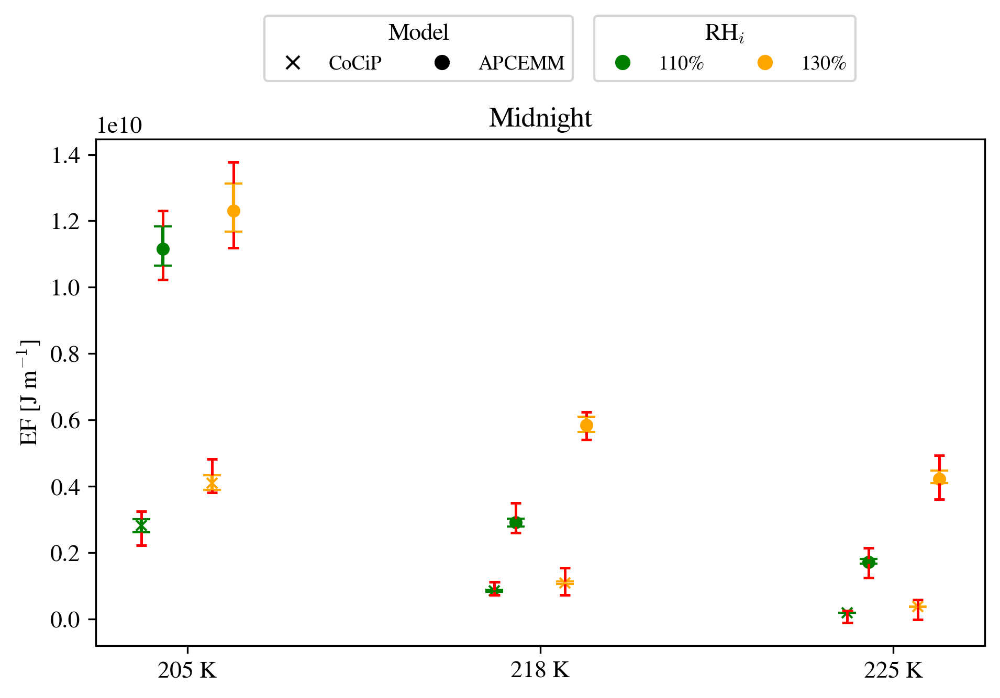

In [49]:
# plotting: midnight only
fig, ax = plt.subplots(1, 1, figsize=(6.5, 4), dpi=300)

model_order = ['CoCiP', 'APCEMM']
marker_map = {'APCEMM': 'o', 'CoCiP': 'x'}
model_offset = {'CoCiP': -0.03, 'APCEMM': 0.03}
rh_color = {'110': 'green', '130': 'orange'}

temps_unique = sorted({int(tid.split('T')[1].split('L')[0]) for tid in test_ids})
x_temp = np.arange(len(temps_unique))
temp_to_x = {T: i for i, T in enumerate(temps_unique)}

tids_by_temp = {
    T: sorted([tid for tid in test_ids if f'T{T}' in tid], key=lambda s: int(s[:3]))
    for T in temps_unique
}

case_offsets_map = {}
for T in temps_unique:
    n = len(tids_by_temp[T])
    if n == 1:
        case_offsets_map[T] = {tids_by_temp[T][0]: 0.0}
    else:
        offs = np.linspace(-0.10, 0.10, n)
        case_offsets_map[T] = {tid: off for tid, off in zip(tids_by_temp[T], offs)}

tt = '0h'
rng = np.random.default_rng(42)  # reproducible random stacked red errors

for T in temps_unique:
    x0 = temp_to_x[T]
    for tid in tids_by_temp[T]:
        for m in model_order:
            s = stats_case[tid][m].get(tt)
            if s is None:
                continue

            x = x0 + case_offsets_map[T][tid] + model_offset[m]
            y = s['mean']
            low = y - s['min']
            high = s['max'] - y
            yerr = np.array([[low], [high]])
            c = rh_color.get(tid[:3], 'black')

            # original error bar
            ax.errorbar(
                x, y, yerr=yerr,
                fmt=marker_map[m], color=c,
                capsize=4, markersize=5, linestyle=''
            )

            # random red extension stacked on top of both ends
            extra_low = rng.uniform(0.05, 1) * max(low, 5e8)
            extra_high = rng.uniform(0.05, 1) * max(high, 5e8)

            y_bottom = y - low
            y_top = y + high

            # lower red stacked segment + cap
            ax.vlines(x, y_bottom - extra_low, y_bottom, colors='red', linewidth=1.2, zorder=3)
            ax.hlines(y_bottom - extra_low, x - 0.015, x + 0.015, colors='red', linewidth=1.2, zorder=3)

            # upper red stacked segment + cap
            ax.vlines(x, y_top, y_top + extra_high, colors='red', linewidth=1.2, zorder=3)
            ax.hlines(y_top + extra_high, x - 0.015, x + 0.015, colors='red', linewidth=1.2, zorder=3)

ax.set_title('Midnight')
ax.set_xticks(x_temp)
ax.set_xticklabels([f'{T} K' for T in temps_unique])
ax.set_ylabel('EF [J m$^{-1}$]')

# legends
model_handles = [Line2D([0], [0], marker=marker_map[m], color='k', lw=0, label=m) for m in model_order]
color_handles = [
    Line2D([0], [0], marker='o', color='green', lw=0, label='110%'),
    Line2D([0], [0], marker='o', color='orange', lw=0, label='130%'),
]

fig.legend(handles=model_handles, title='Model', loc='upper center', ncol=2, bbox_to_anchor=(0.42, 1.12), fontsize='small')
fig.legend(handles=color_handles, title='RH$_i$', loc='upper center', ncol=2, bbox_to_anchor=(0.72, 1.12), fontsize='small')

plt.tight_layout()
plt.show()


## Synoptic view of EF outcomes

In [50]:
# aggregate EF values per test case (tid) and model, truncated at contrail age <= 4 h
base_apcemm = '/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/APCEMM/RF_EF_results'
base_cocip  = '/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/CoCiP/RF_EF_results'
base_les    = '/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/LES/RF_EF_results'

time_tags = ['0h', '12h']
habits = ['solid-column', 'ghm', 'rough-aggregate']
models = {'APCEMM': base_apcemm, 'CoCiP': base_cocip, 'LES': base_les}

per_case_4h = {tid: {m: {tt: [] for tt in time_tags} for m in models} for tid in test_ids}

target_age_h = 4.0

# Import EF values for each case/model/time, keeping only data up to 4 hours
for m, base in models.items():
    for tid in test_ids:
        for h in habits:
            for tt in time_tags:
                ef_path = f"{base}/{tid}/EF/{tid}_EF_{h}_{tt}_LRT.csv"
                if not os.path.exists(ef_path):
                    continue
                
                df_ = pd.read_csv(ef_path)

                df_4h = df_.loc[df_['Contrail_Age_hours'] <= target_age_h, ['Contrail_Age_hours', 'EF_J_m']].dropna()

                if not df_4h.empty:
                    per_case_4h[tid][m][tt].append(float(df_4h['EF_J_m'].iloc[-1]))

# compute stats (mean/min/max) per case
stats_case_4h = {tid: {m: {tt: None for tt in time_tags} for m in models} for tid in test_ids}
for tid in test_ids:
    for m in models:
        for tt in time_tags:
            vals = np.array(per_case_4h[tid][m][tt], dtype=float)
            if vals.size:
                stats_case_4h[tid][m][tt] = {
                    'mean': vals.mean(),
                    'min': vals.min(),
                    'max': vals.max()
                }

In [51]:
stats_case_4h['110T218L25']['CoCiP']

{'0h': {'mean': 155957315.05179945,
  'min': 147266791.70156723,
  'max': 165124338.1699465},
 '12h': {'mean': -52554599.752528705,
  'min': -70138952.55956464,
  'max': -41198829.69142641}}

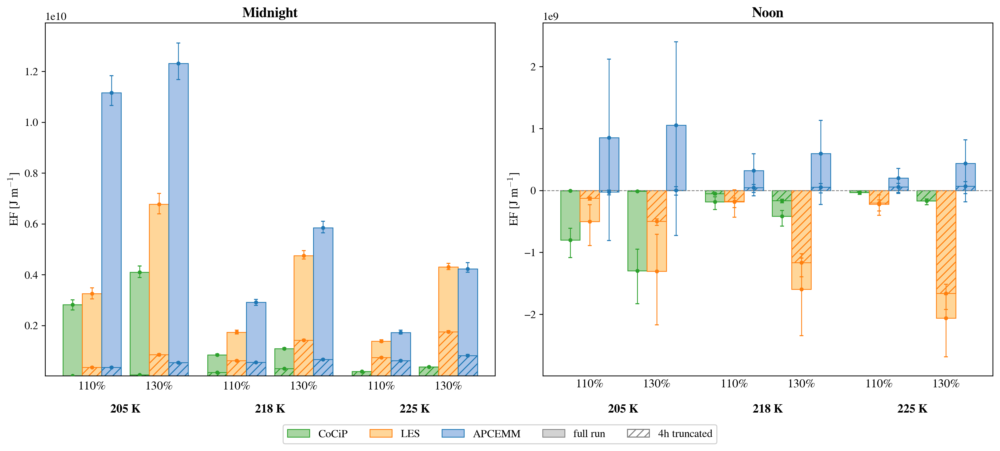

In [52]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

# ── helper: draw all bars + errorbars onto a given axes ──────────────────────
def draw_bars(ax, tt):
    for gi, (T, tid) in enumerate(groups):
        x_group = group_starts[gi]
        for mi, m in enumerate(model_order):
            xc        = x_group + mi * bar_width
            xc_center = xc + bar_width / 2
            col       = model_colors[m]
            col_light = model_colors_light[m]

            s4 = stats_case_4h.get(tid, {}).get(m, {}).get(tt, None)
            sf = stats_case.get(tid, {}).get(m, {}).get(tt, None)

            if sf is not None:
                yf    = sf['mean']
                ax.bar(xc, abs(yf), bottom=min(yf, 0), width=bar_width,
                       align='edge', color=col_light, edgecolor=col,
                       linewidth=0.8, hatch='', zorder=2)
                ax.errorbar(xc_center, yf,
                            yerr=[[yf - sf['min']], [sf['max'] - yf]],
                            fmt='o', color=col, ecolor=col, elinewidth=0.8,
                            capsize=2, markersize=3, zorder=4)

            if s4 is not None:
                y4    = s4['mean']
                ax.bar(xc, abs(y4), bottom=min(y4, 0), width=bar_width,
                       align='edge', color='None', edgecolor=col,
                       linewidth=0.8, hatch='///', zorder=2)
                ax.errorbar(xc_center, y4,
                            yerr=[[y4 - s4['min']], [s4['max'] - y4]],
                            fmt='o', color=col, ecolor=col, elinewidth=0.8,
                            capsize=2, markersize=3, zorder=4)

# ── layout ────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=300, sharey=False)

# ── group x-axis by temperature → RHi ────────────────────────────────────────
temps_unique = sorted({int(tid.split('T')[1].split('L')[0]) for tid in test_ids})

rhi_labels  = ['110%', '130%']
rh_to_label = {v: k for k, v in rh_color.items()}

groups = []
for T in temps_unique:
    tids_at_T = sorted(
        [tid for tid in test_ids if f"T{T}" in tid],
        key=lambda s: int(s[:3])
    )
    for tid in tids_at_T:
        groups.append((T, tid))

n_groups    = len(groups)
model_order = ['CoCiP', 'LES', 'APCEMM']
n_models    = len(model_order)
bar_width   = 0.22
group_gap   = 0.12

def group_x_positions(groups, temps_unique, bar_width, group_gap):
    x0, positions, prev_T = 0.0, [], None
    for (T, tid) in groups:
        if prev_T is not None and T != prev_T:
            x0 += group_gap
        positions.append(x0)
        x0 += n_models * bar_width + 0.10
        prev_T = T
    return positions

group_starts = group_x_positions(groups, temps_unique, bar_width, group_gap)

model_colors = {'CoCiP': 'tab:green', 'LES': 'tab:orange', 'APCEMM': 'tab:blue'}
model_colors_light = {
    'CoCiP':  '#a8d5a2',
    'LES':    '#ffd699',
    'APCEMM': '#a8c4e8',
}

x_left  = -0.2
x_right = group_starts[-1] + n_models * bar_width + 0.2

# ── zoom windows ──────────────────────────────────────────────────────────────
zoom_cfg = {
    'Midnight': {'ylim': (None, 0.2e10)},   # y < 0.2e10
    'Noon':     {'ylim': (-0.5e9, 0.1e9)},  # -0.5e9 < y < 0.1e9
}

# ── main panels ───────────────────────────────────────────────────────────────
for ax, tt, title in zip(axes, time_tags, ['Midnight', 'Noon']):
    draw_bars(ax, tt)
    ax.axhline(0, color='gray', linestyle='--', lw=0.8)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xticks([])
    ax.set_xlim(x_left, x_right)

# ── y limits ──────────────────────────────────────────────────────────────────
ax_ylims = {}
for ax, tt in zip(axes, time_tags):
    ymins, ymaxs = [], []
    for tid in test_ids:
        for m in model_order:
            for s in [stats_case_4h.get(tid, {}).get(m, {}).get(tt),
                      stats_case.get(tid, {}).get(m, {}).get(tt)]:
                if s:
                    ymins.append(s['min'])
                    ymaxs.append(s['max'])
    ymin = min(ymins) if ymins else -1
    ymax = max(ymaxs) if ymaxs else 1

    pad  = 0.06 * (ymax - ymin)
    if tt == '0h':
        ax.set_ylim(ymin, ymax + pad)
    else: 
        ax.set_ylim(ymin - pad, ymax + pad)
    
    ax.set_ylabel('EF [J m$^{-1}$]', fontsize=12)
    ax_ylims[tt] = ax.get_ylim()

# ── x-tick labels ─────────────────────────────────────────────────────────────
for ax, tt, title in zip(axes, time_tags, ['Midnight', 'Noon']):
    ymin_ax, ymax_ax = ax_ylims[tt]
    ybot = ymin_ax
    for gi, (T, tid) in enumerate(groups):
        xc = group_starts[gi] + (n_models * bar_width) / 2
        rhi_str = tid[:3] + '%'
        offset = 0.02e10 if title == 'Midnight' else 0.05e9
        ax.text(xc, ybot - offset, rhi_str, ha='center', va='top', fontsize=12,
                transform=ax.transData, clip_on=False)

    prev_T, block_start_x = None, None
    def flush_temp_label(ax, T, bsx, bex, ybot, ymn, ymx):
        xc = (bsx + bex) / 2
        ax.text(xc, ybot - 0.08 * (ymx - ymn),
                f'{T} K', ha='center', va='top', fontsize=12, fontweight='bold',
                transform=ax.transData, clip_on=False)

    for gi, (T, tid) in enumerate(groups):
        if T != prev_T:
            if prev_T is not None:
                flush_temp_label(ax, prev_T, block_start_x,
                                 group_starts[gi-1] + n_models * bar_width,
                                 ybot, ymin_ax, ymax_ax)
            block_start_x = group_starts[gi]
            prev_T = T
    flush_temp_label(ax, prev_T, block_start_x,
                     group_starts[-1] + n_models * bar_width,
                     ybot, ymin_ax, ymax_ax)

# ── legend along bottom of figure ────────────────────────────────────────────
model_handles = [
    mpatches.Patch(facecolor=model_colors_light[m], edgecolor=model_colors[m],
                   linewidth=0.8, label=m)
    for m in model_order
]
trunc_patch = mpatches.Patch(facecolor='None', edgecolor='gray',
                              hatch='///', label='4h truncated')
full_patch  = mpatches.Patch(facecolor='lightgray', edgecolor='gray',
                              linewidth=0.8, label='full run')

fig.legend(
    handles=model_handles + [full_patch, trunc_patch],
    loc='lower center', ncol=5, fontsize=11, framealpha=0.9,
    bbox_to_anchor=(0.5, -0.05)
)

plt.tight_layout()
plt.subplots_adjust(bottom=0.12)
plt.show()

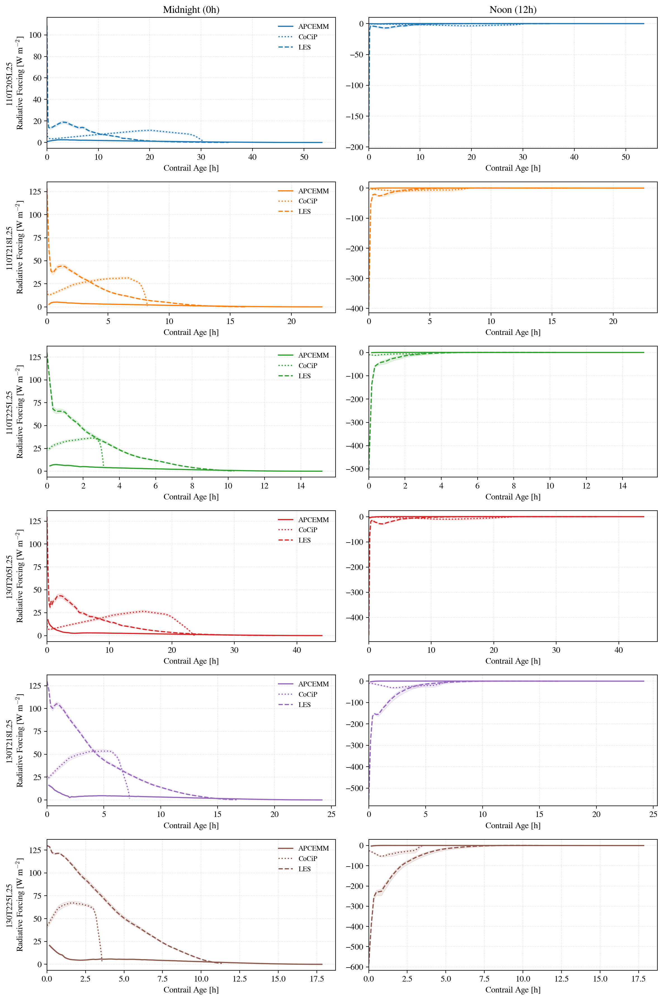

In [53]:
# Aggregate and plot mean RF ± min/max for APCEMM, CoCiP and LES across habits

times = {'0h': 'Midnight (0h)', '12h': 'Noon (12h)'}
habits = ['solid-column', 'ghm', 'rough-aggregate']

def load_model_time_rf(base_dir, tid, habits, model='CoCiP', time_tag='0h'):
    series_list = []
    for h in habits:
        if model == 'APCEMM':
            lw_p = f"{base_dir}/{tid}/RF/outputs/LW_RF_APCEMM_{h}_{time_tag}_IWC_{tid}.csv"
            sw_p = f"{base_dir}/{tid}/RF/outputs/SW_RF_APCEMM_{h}_{time_tag}_IWC_{tid}.csv"
        elif model == 'LES':
            lw_p = f"{base_dir}/{tid}/RF/outputs/LW_RF_LES_{h}_{time_tag}_IWC_{tid}.csv"
            sw_p = f"{base_dir}/{tid}/RF/outputs/SW_RF_LES_{h}_{time_tag}_IWC_{tid}.csv"
        else:  # CoCiP / default
            lw_p = f"{base_dir}/{tid}/RF/outputs/{tid}_LW_{h}_{time_tag}_IWC.csv"
            sw_p = f"{base_dir}/{tid}/RF/outputs/{tid}_SW_{h}_{time_tag}_IWC.csv"

        df = None
        try:
            if os.path.exists(lw_p) and os.path.exists(sw_p):
                lw = pd.read_csv(lw_p); sw = pd.read_csv(sw_p)
                df = _sum_rf_dfs(lw, sw)
            elif os.path.exists(lw_p):
                df = pd.read_csv(lw_p)
            elif os.path.exists(sw_p):
                df = pd.read_csv(sw_p)
        except Exception:
            df = None

        if df is not None:
            rf_col = [c for c in df.columns if 'Radiative' in c][0]
            s = df.set_index('Contrail_Age_hours')[rf_col]
            series_list.append(s)
    return series_list

# prepare colormap for test cases
cmap = cm.get_cmap('tab10')
tid_colors = {tid: cmap(i % cmap.N) for i, tid in enumerate(test_ids)}

# collect stats (add LES)
stats_by_time = {tt: {'APCEMM': {}, 'CoCiP': {}, 'LES': {}} for tt in times.keys()}

for tt in times.keys():
    for tid in test_ids:
        # APCEMM
        ap_series = load_model_time_rf(base_apcemm, tid, habits, model='APCEMM', time_tag=tt)
        if ap_series:
            ages = np.unique(np.concatenate([s.index.values for s in ap_series]))
            ages.sort()
            df_ap = pd.DataFrame({i: s.reindex(ages).values for i,s in enumerate(ap_series)}, index=ages)
            stats_by_time[tt]['APCEMM'][tid] = pd.DataFrame({
                'age': ages,
                'mean': np.nanmean(df_ap.values, axis=1),
                'min': np.nanmin(df_ap.values, axis=1),
                'max': np.nanmax(df_ap.values, axis=1),
            })
        # CoCiP
        co_series = load_model_time_rf(base_cocip, tid, habits, model='CoCiP', time_tag=tt)
        if co_series:
            ages = np.unique(np.concatenate([s.index.values for s in co_series]))
            ages.sort()
            df_co = pd.DataFrame({i: s.reindex(ages).values for i,s in enumerate(co_series)}, index=ages)
            stats_by_time[tt]['CoCiP'][tid] = pd.DataFrame({
                'age': ages,
                'mean': np.nanmean(df_co.values, axis=1),
                'min': np.nanmin(df_co.values, axis=1),
                'max': np.nanmax(df_co.values, axis=1),
            })
        # LES
        les_base = models.get('LES', None) if 'models' in globals() else None
        if les_base is not None:
            les_series = load_model_time_rf(les_base, tid, habits, model='LES', time_tag=tt)
            if les_series:
                ages = np.unique(np.concatenate([s.index.values for s in les_series]))
                ages.sort()
                df_les = pd.DataFrame({i: s.reindex(ages).values for i,s in enumerate(les_series)}, index=ages)
                stats_by_time[tt]['LES'][tid] = pd.DataFrame({
                    'age': ages,
                    'mean': np.nanmean(df_les.values, axis=1),
                    'min': np.nanmin(df_les.values, axis=1),
                    'max': np.nanmax(df_les.values, axis=1),
                })

# Plot: rows per test_id and 2 columns (times)
n_tests = len(test_ids)
fig, axes = plt.subplots(nrows=n_tests, ncols=2, figsize=(12, 3 * n_tests), dpi=200, sharey=False)
if axes.ndim == 1:
    axes = axes.reshape((n_tests, 2))

for row_idx, tid in enumerate(test_ids):
    for col_idx, (tt, title) in enumerate(times.items()):
        ax = axes[row_idx, col_idx]
        color = tid_colors.get(tid, None)

        # APCEMM (skip first datapoint if present)
        apdf = stats_by_time[tt]['APCEMM'].get(tid, None)
        if apdf is not None:
            if len(apdf) > 1:
                ages = apdf['age'].iloc[1:]
                mean = apdf['mean'].iloc[1:]
                mn = apdf['min'].iloc[1:]
                mx = apdf['max'].iloc[1:]
            else:
                ages = apdf['age']
                mean = apdf['mean']
                mn = apdf['min']
                mx = apdf['max']
            ax.plot(ages, mean, color=color, linestyle='-', label='APCEMM')
            ax.fill_between(ages, mn, mx, color=color, alpha=0.18)

        # CoCiP
        codf = stats_by_time[tt]['CoCiP'].get(tid, None)
        if codf is not None:
            ax.plot(codf['age'], codf['mean'], color=color, linestyle=':', label='CoCiP')
            ax.fill_between(codf['age'], codf['min'], codf['max'], color=color, alpha=0.10)

        # LES
        lesdf = stats_by_time[tt]['LES'].get(tid, None)
        if lesdf is not None:
            ax.plot(lesdf['age'], lesdf['mean'], color=color, linestyle='--', label='LES')
            ax.fill_between(lesdf['age'], lesdf['min'], lesdf['max'], color=color, alpha=0.12)

        if row_idx == 0:
            ax.set_title(title)
        if col_idx == 0:
            ax.set_ylabel(tid + '\nRadiative Forcing [W m$^{-2}$]')
        ax.set_xlabel('Contrail Age [h]')
        ax.set_xlim(left=0)
        ax.grid(True, linestyle=':', alpha=0.4)

    # add legend for this test_id in the right column only (avoid duplicate legends)
    handles, labels = axes[row_idx, 1].get_legend_handles_labels()
    uniq = {}
    uniq_handles, uniq_labels = [], []
    for h, l in zip(handles, labels):
        if l not in uniq:
            uniq[l] = True
            uniq_handles.append(h)
            uniq_labels.append(l)
    if uniq_handles:
        axes[row_idx, 0].legend(uniq_handles, uniq_labels, loc='upper right', fontsize='small', frameon=False)

plt.tight_layout()
plt.show()

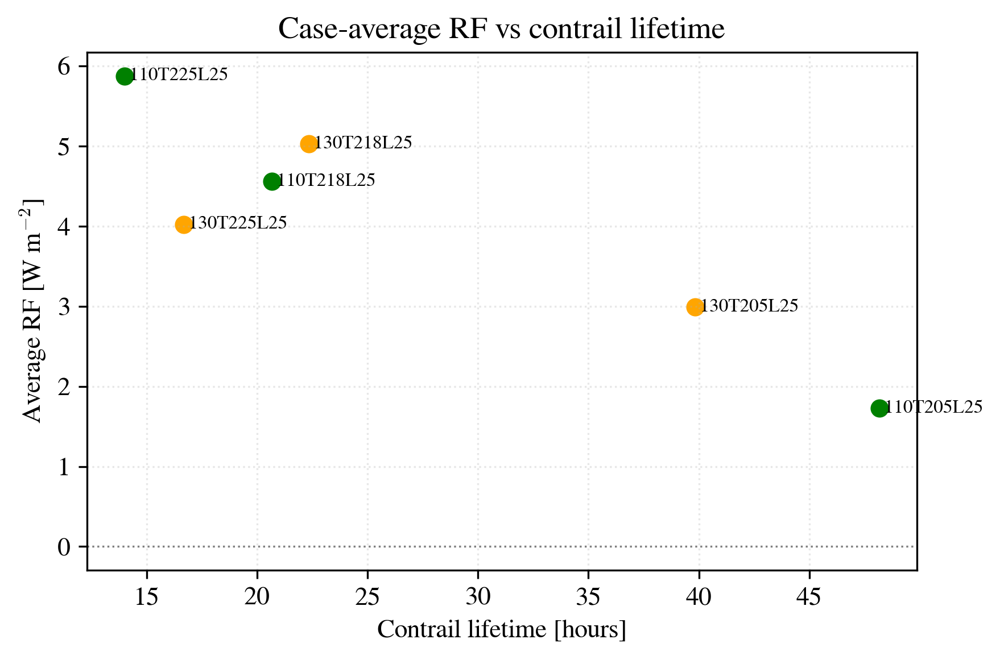

,tid,lifetime_h,avg_rf_wm2
2,110T225L25,14.000000,5.877098
5,130T225L25,16.666667,4.024437
1,110T218L25,20.666667,4.558297
4,130T218L25,22.333333,5.029293
3,130T205L25,39.833333,2.991447
0,110T205L25,48.166667,1.728105


In [54]:
# Average RF (single value) vs contrail lifetime (single value) for each case (tid)

rf_bases = {
    "APCEMM": "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/APCEMM/RF_EF_results",
    "CoCiP":  "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/CoCiP/RF_EF_results",
    "LES":    "/home/chinahg/GCresearch/contrailuncertainty/APCEMM_vs_CoCiP_vs_LES/LES/RF_EF_results",
}
rf_habits = ['solid-column', 'ghm', 'rough-aggregate']
rf_time_tags = ['0h', '12h']

def load_net_rf_df(model, base_dir, tid, habit, tt):
    if model == "APCEMM":
        lw_p = f"{base_dir}/{tid}/RF/outputs/LW_RF_APCEMM_{habit}_{tt}_IWC_{tid}.csv"
        sw_p = f"{base_dir}/{tid}/RF/outputs/SW_RF_APCEMM_{habit}_{tt}_IWC_{tid}.csv"
    elif model == "LES":
        lw_p = f"{base_dir}/{tid}/RF/outputs/LW_RF_LES_{habit}_{tt}_IWC_{tid}.csv"
        sw_p = f"{base_dir}/{tid}/RF/outputs/SW_RF_LES_{habit}_{tt}_IWC_{tid}.csv"
    else:  # CoCiP
        lw_p = f"{base_dir}/{tid}/RF/outputs/{tid}_LW_{habit}_{tt}_IWC.csv"
        sw_p = f"{base_dir}/{tid}/RF/outputs/{tid}_SW_{habit}_{tt}_IWC.csv"

    try:
        if os.path.exists(lw_p) and os.path.exists(sw_p):
            lw = pd.read_csv(lw_p)
            sw = pd.read_csv(sw_p)
            return _sum_rf_dfs(lw, sw)
        if os.path.exists(lw_p):
            return pd.read_csv(lw_p)
        if os.path.exists(sw_p):
            return pd.read_csv(sw_p)
    except Exception:
        return None
    return None

rows = []
for tid in test_ids:
    rf_vals = []

    # average RF across all available model/habit/time combinations
    for model, base_dir in rf_bases.items():
        for h in rf_habits:
            for tt in rf_time_tags:
                df_rf = load_net_rf_df(model, base_dir, tid, h, tt)
                if df_rf is None:
                    continue
                rf_col = [c for c in df_rf.columns if "Radiative" in c]
                if not rf_col:
                    continue
                rf_vals.append(float(np.nanmean(df_rf[rf_col[0]].values)))

    # lifetime: use APCEMM 1%-of-peak age if available, else APCEMM run length
    if "results" in globals() and tid in results:
        lifetime_h = float(results[tid][2])
    elif tid in apcemm_bypass_data:
        lifetime_h = len(apcemm_bypass_data[tid]) * 10.0 / 60.0
    else:
        lifetime_h = np.nan

    rows.append({
        "tid": tid,
        "lifetime_h": lifetime_h,
        "avg_rf_wm2": np.nanmean(rf_vals) if len(rf_vals) else np.nan
    })

rf_case_df = pd.DataFrame(rows).dropna(subset=["lifetime_h", "avg_rf_wm2"])

plt.figure(figsize=(6, 4), dpi=300)
for _, r in rf_case_df.iterrows():
    c = rh_color.get(r["tid"][:3], "black") if "rh_color" in globals() else "black"
    plt.scatter(r["lifetime_h"], r["avg_rf_wm2"], color=c, s=45)
    plt.text(r["lifetime_h"], r["avg_rf_wm2"], f" {r['tid']}", fontsize=8, va="center")

plt.axhline(0, color="gray", linestyle=":", linewidth=0.8)
plt.xlabel("Contrail lifetime [hours]")
plt.ylabel("Average RF [W m$^{-2}$]")
plt.title("Case-average RF vs contrail lifetime")
plt.grid(alpha=0.3, linestyle=":")
plt.tight_layout()
plt.show()

rf_case_df.sort_values("lifetime_h")

## All Models

## Plot IWC, depth, and effective radius for the 110T218L25 case at midnight and noon

110T205L25 CoCiP initial depth: 102.7 m, initial width: 22.7 m, initial area: 1831.5 m², initial IWC: 4.22e-03 g/m³
110T205L25 APCEMM initial ice number: 3.58e+12, initial ice mass: 1.73e-02 kg
110T205L25 APCEMM initial depth: 100.0 m, initial width: 10.0 m, initial IWC: 1.36e-02 g/m³, initial sauter radius: 1.2 µm
110T205L25 LES initial depth: 100.0 m, initial mean radius: 1.5 µm, initial IWC: 1.20e-01 g/m³


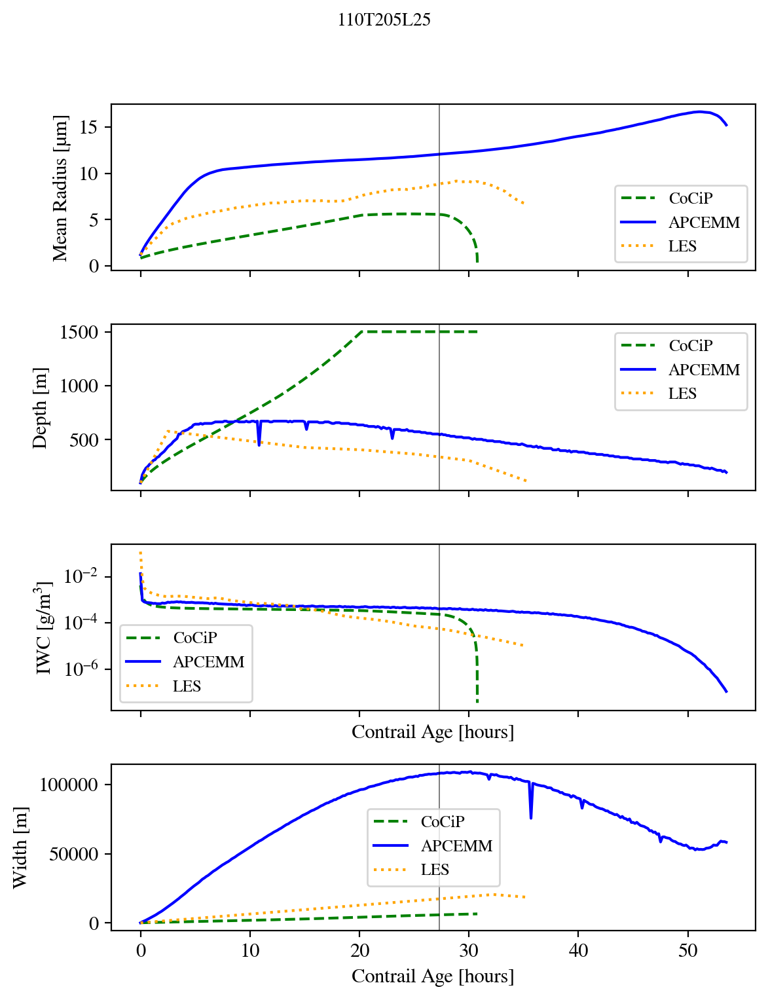

110T218L25 CoCiP initial depth: 102.8 m, initial width: 22.2 m, initial area: 1789.3 m², initial IWC: 6.49e-03 g/m³
110T218L25 APCEMM initial ice number: 9.47e+11, initial ice mass: 4.59e-03 kg
110T218L25 APCEMM initial depth: 100.0 m, initial width: 10.0 m, initial IWC: 3.61e-03 g/m³, initial sauter radius: 1.2 µm
110T218L25 LES initial depth: 100.0 m, initial mean radius: 3.4 µm, initial IWC: 3.99e-01 g/m³


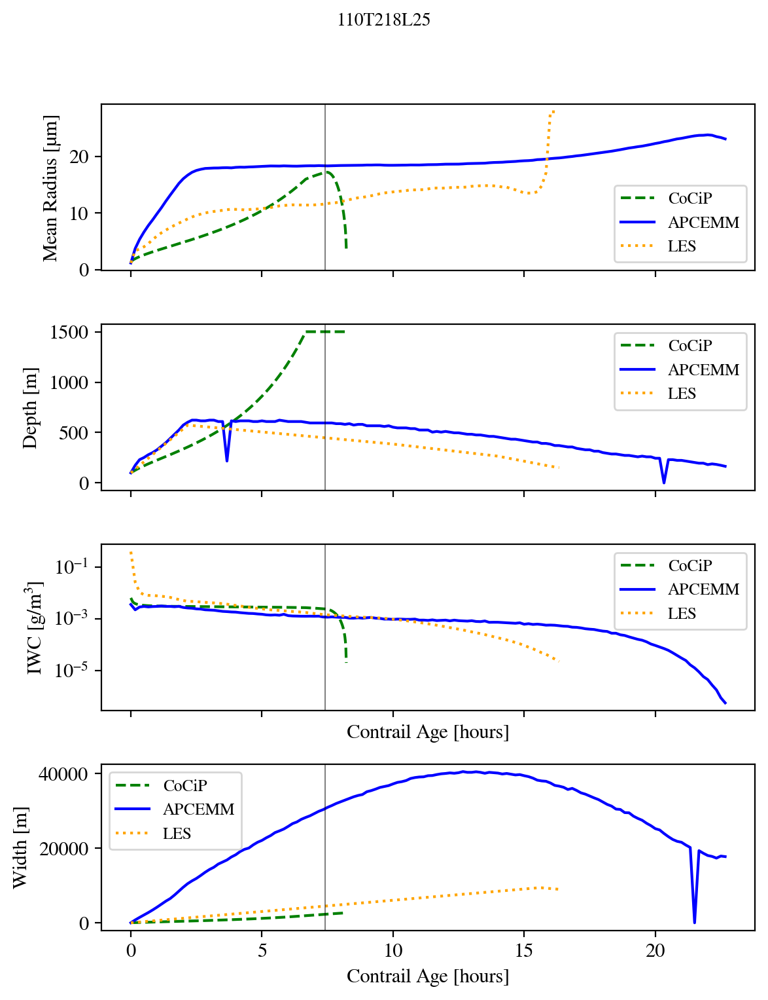

110T225L25 CoCiP initial depth: 103.0 m, initial width: 21.9 m, initial area: 1770.7 m², initial IWC: 1.04e-02 g/m³
110T225L25 APCEMM initial ice number: 5.88e+11, initial ice mass: 2.85e-03 kg
110T225L25 APCEMM initial depth: 100.0 m, initial width: 10.0 m, initial IWC: 2.23e-03 g/m³, initial sauter radius: 1.2 µm
110T225L25 LES initial depth: 100.0 m, initial mean radius: 5.3 µm, initial IWC: 1.01e+00 g/m³


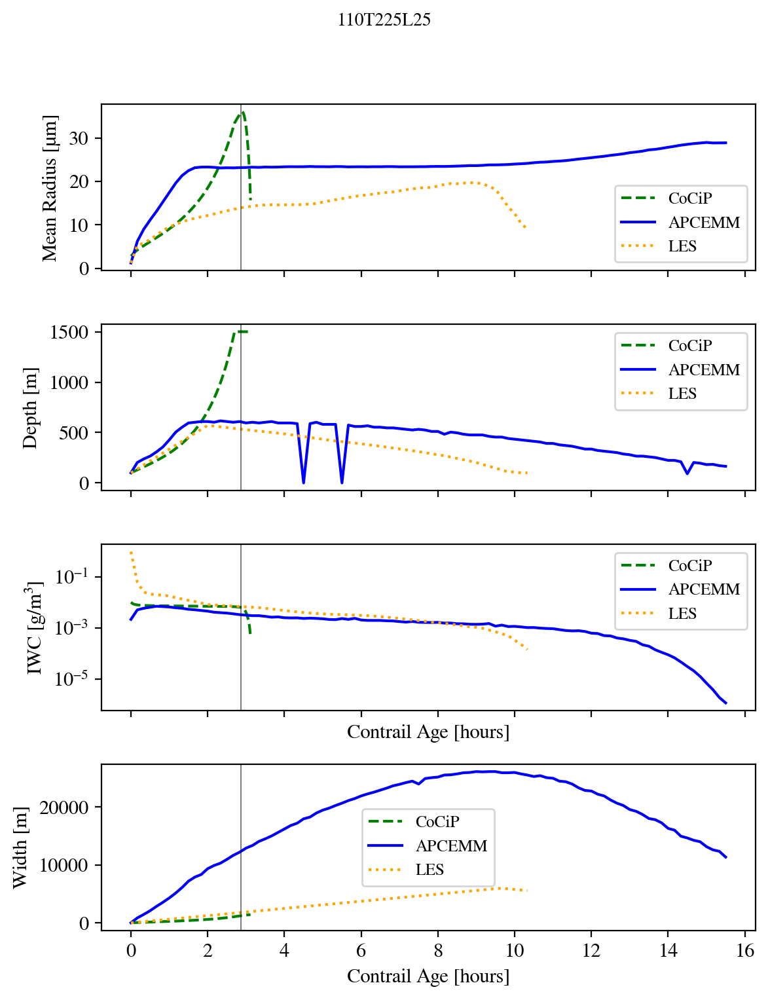

130T205L25 CoCiP initial depth: 102.7 m, initial width: 22.7 m, initial area: 1831.4 m², initial IWC: 4.95e-03 g/m³


In [ ]:
# Plot the 3-panel comparison for each test case
for tid in test_ids:
    # gather CoCiP
    if tid not in cocip_bypass_data:
        continue
    cocip_ds = cocip_bypass_data[tid]
    cocip_times = cocip_ds['age_hours'].values
    cocip_radii = cocip_ds['r_ice_vol'].values * 1e6
    cocip_depth = cocip_ds['depth'].values
    cocip_IWC = cocip_ds['iwc'].values * cocip_ds['rho_air'] * 1e3
    cocip_alt = cocip_ds['altitude'].values
    cocip_width = cocip_ds['width'].values
    target_alt = 10200
    cocip_centroid_at_subsat_idx = int(np.abs(cocip_alt - target_alt).argmin())
    vline_t = cocip_times[cocip_centroid_at_subsat_idx]

    print(f"{tid} CoCiP initial depth: {cocip_depth[0]:.1f} m, initial width: {cocip_ds['width'].values[0]:.1f} m, initial area: {cocip_ds['area_eff'].values[0]:.1f} m², initial IWC: {cocip_IWC[0]:.2e} g/m³")
    
    # APCEMM
    if tid not in apcemm_bypass_data:
        continue
    APCEMM_ds = apcemm_bypass_data[tid]
    timesteps = len(APCEMM_ds)
    n_bins = len(APCEMM_ds[0]['r'].values)
    APCEMM_depth = np.zeros(timesteps)
    APCEMM_radii_bins = APCEMM_ds[0]['r'].values * 1e6
    APCEMM_radii_counts = np.zeros((n_bins, timesteps))
    APCEMM_IWC_avg = np.zeros(timesteps)
    APCEMM_width = np.zeros(timesteps)
    APCEMM_volume_radii = np.zeros(timesteps)

    for i in range(timesteps):
        APCEMM_depth[i] = APCEMM_ds[i]['depth'].values.item()
        APCEMM_radii_counts[:, i] = APCEMM_ds[i]["Overall size distribution"].values
        APCEMM_width[i] = APCEMM_ds[i]['width'].values.item()  # [m]
        APCEMM_IWC_avg[i] = np.max(APCEMM_ds[i]['IWC'].values) * 1e3  # convert from kg/m³ to g/m³

    APCEMM_times = np.arange(timesteps) * 10 / 60
    APCEMM_radii = np.zeros(len(APCEMM_times))
    for p in range(len(APCEMM_times)):
        APCEMM_radii[p] = LRTlib.calculate_sauter_mean(APCEMM_radii_bins, APCEMM_radii_counts[:, p])

    APCEMM_ice_num = [APCEMM_ds[i]["Number Ice Particles"].item() for i in range(timesteps)]
    APCEMM_ice_mass = [APCEMM_ds[i]["Ice Mass"].item() for i in range(timesteps)]
    print(f"{tid} APCEMM initial ice number: {APCEMM_ice_num[0]:.2e}, initial ice mass: {APCEMM_ice_mass[0]:.2e} kg")
    APCEMM_volume_radii = (3 * np.array(APCEMM_ice_mass) / (4 * np.pi * 917 * np.array(APCEMM_ice_num)))**(1/3) * 1e6

    print(f"{tid} APCEMM initial depth: {APCEMM_depth[0]:.1f} m, initial width: {APCEMM_width[0]:.1f} m, initial IWC: {APCEMM_IWC_avg[0]:.2e} g/m³, initial sauter radius: {APCEMM_radii[0]:.1f} µm")

    # LES (if available)
    LES_radii = LES_depth = LES_IWC = LES_times = np.array([])
    if tid in LES_data:
        LES_ds = LES_data[tid]
        LES_radii = np.array(LES_ds.get('Effective_radius_um', np.array([])))
        LES_depth = np.array(LES_ds.get('Depth_m', np.array([])))
        LES_IWC = np.array(LES_ds.get('IWC_g_per_m3', np.array([])))
        LES_times = np.array(LES_ds.get('Time_hours', np.array([])))
        LES_width = np.array(LES_ds.get('Width_m', np.array([])))

    print(f"{tid} LES initial depth: {LES_depth[0]:.1f} m, initial mean radius: {LES_radii[1]:.1f} µm, initial IWC: {LES_IWC[0]:.2e} g/m³" if LES_times.size else f"{tid} LES data not available")

    # plotting - assign distinct colors per model
    model_colors = {'APCEMM': 'blue', 'CoCiP': 'green', 'LES': 'orange'}
    styles = {'APCEMM': '-', 'CoCiP': '--', 'LES': ':'}
    fig, ax = plt.subplots(4, 1, figsize=(6, 8), dpi=200, sharex=True)
    fig.suptitle(tid, fontsize=10)

    ax[0].plot(cocip_times, cocip_radii, label='CoCiP', color=model_colors['CoCiP'], linestyle=styles['CoCiP'])
    ax[0].plot(APCEMM_times, APCEMM_radii, label='APCEMM', color=model_colors['APCEMM'], linestyle=styles['APCEMM'])
    if LES_times.size:
        ax[0].plot(LES_times, LES_radii, label='LES', color=model_colors['LES'], linestyle=styles['LES'])
    ax[0].axvline(vline_t, color='k', lw=0.6, alpha=0.6)
    ax[0].set_ylabel('Mean Radius [µm]')
    ax[0].legend(fontsize='small')

    ax[1].plot(cocip_times, cocip_depth, label='CoCiP', color=model_colors['CoCiP'], linestyle=styles['CoCiP'])
    ax[1].plot(APCEMM_times, APCEMM_depth, label='APCEMM', color=model_colors['APCEMM'], linestyle=styles['APCEMM'])
    if LES_times.size:
        ax[1].plot(LES_times, LES_depth, label='LES', color=model_colors['LES'], linestyle=styles['LES'])
    ax[1].axvline(vline_t, color='k', lw=0.6, alpha=0.6)
    ax[1].set_ylabel('Depth [m]')
    ax[1].legend(fontsize='small')

    ax[2].plot(cocip_times, cocip_IWC, label='CoCiP', color=model_colors['CoCiP'], linestyle=styles['CoCiP'])
    ax[2].plot(APCEMM_times, APCEMM_IWC_avg, label='APCEMM', color=model_colors['APCEMM'], linestyle=styles['APCEMM'])
    if LES_times.size:
        ax[2].plot(LES_times, LES_IWC, label='LES', color=model_colors['LES'], linestyle=styles['LES'])
    ax[2].axvline(vline_t, color='k', lw=0.6, alpha=0.6)
    ax[2].set_xlabel('Contrail Age [hours]')
    ax[2].set_ylabel('IWC [g/m³]')
    ax[2].legend(fontsize='small')
    ax[2].set_yscale('log')

    ax[3].plot(cocip_times, cocip_width, label='CoCiP', color=model_colors['CoCiP'], linestyle=styles['CoCiP'])
    ax[3].plot(APCEMM_times, APCEMM_width, label='APCEMM', color=model_colors['APCEMM'], linestyle=styles['APCEMM'])
    if LES_times.size:
        ax[3].plot(LES_times, LES_width, label='LES', color=model_colors['LES'], linestyle=styles['LES'])
    ax[3].axvline(vline_t, color='k', lw=0.6, alpha=0.6)
    ax[3].set_xlabel('Contrail Age [hours]')
    ax[3].set_ylabel('Width [m]')
    ax[3].legend(fontsize='small')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


In [ ]:
# Combined 3x3 comparison: 110% (black) vs 130% (red), otherwise same config
tests = ['110T218L25', '130T225L25']
colors = {'110': 'black', '130': 'red'}

plot_times_min = [0, 300, 600, 900, 1200, 1260]
plot_indices = [int(t / 10) for t in plot_times_min]

fig, axes = plt.subplots(3,2, figsize=(18, 15), dpi=300, sharey=True)
axes = axes.flatten()

for i, idx in enumerate(plot_indices):
    ax = axes[i]
    for t_id in tests:
        color = colors[t_id[:3]]
        cocip_ds = cocip_bypass_data.get(t_id, None)

        # APCEMM (may raise if idx out of range; follow original behavior)
        try:
            ds = apcemm_bypass_data[t_id][idx]
        except Exception:
            # skip if APCEMM timestep not available
            continue

        r_um = ds['r'].values * 1e6
        size_dist = ds["Overall size distribution"].values #removeLow(ds["Overall size distribution"].values, cutoff=1e-6)
        ax.plot(r_um, size_dist, label=f"APCEMM {t_id[:3]}%", color=color, lw=2)

    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_xlim(1e-1, 2e2)
    ax.set_ylim(1e6, 5e13)
    ax.set_xlabel('Radius [$\\mu$m]')
    ax.set_ylabel('${dN(t)}{d\\log(r)}$ [m$^{-1}$]')
    ax.set_title(f't = {plot_times_min[i]} min' if i > 0 else 't = 0 min')


plt.suptitle('Ice Crystal Radius Distribution Evolution — 110%', fontsize=16)
plt.tight_layout()
plt.show()


# Assessment with Experimental Data